In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
import requests
from PIL import Image
import numpy as np
import math
from io import BytesIO
import requests
from bs4 import BeautifulSoup
import re
import selenium
from selenium import webdriver 
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime, timedelta
from aquarel import load_theme
import random
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

In [2]:
pd.set_option('display.max.rows', 100)
pd.set_option('display.max.columns', 75)
listings = pd.read_csv(r"C:\Users\Nebula PC\Desktop\Portfolio\Airbnb Analysis\Data\listings.csv")
reviews = pd.read_csv(r"C:\Users\Nebula PC\Desktop\Portfolio\Airbnb Analysis\Data\reviews.csv")
#older sets of data collected at earlier dates, with listings_old2 being the oldest
listings_old = pd.read_csv(r"C:\Users\Nebula PC\Desktop\Portfolio\Airbnb Analysis\Data\listings_old.csv")
listings_old2 = pd.read_csv(r"C:\Users\Nebula PC\Desktop\Portfolio\Airbnb Analysis\Data\listings_old2.csv")

# ------------------------------ First Look at the data -----------------------------
Check for the following:
- What features are given, and which of those will be useful
- Features with missing values
- Features with incorrect data types

In [3]:
listings.iloc[0]

id                                                                                       48187393
listing_url                                                 https://www.airbnb.com/rooms/48187393
scrape_id                                                                          20231223055507
last_scraped                                                                           2023-12-23
source                                                                                city scrape
name                                            Home in Bedfordale · ★4.73 · 4 bedrooms · 5 be...
description                                                                                   NaN
neighborhood_overview                                                                         NaN
picture_url                                     https://a0.muscache.com/pictures/prohost-api/H...
host_id                                                                                  34477031
host_url            

In [4]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12521 entries, 0 to 12520
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            12521 non-null  int64  
 1   listing_url                                   12521 non-null  object 
 2   scrape_id                                     12521 non-null  int64  
 3   last_scraped                                  12521 non-null  object 
 4   source                                        12521 non-null  object 
 5   name                                          12521 non-null  object 
 6   description                                   0 non-null      float64
 7   neighborhood_overview                         7635 non-null   object 
 8   picture_url                                   12521 non-null  object 
 9   host_id                                       12521 non-null 

Looking at listings.info(), we see the following:

- many columns provide little to no value to our analysis and can be dropped.
- A few important columns have missing values - price being one of them - and some columns are empty.
- many columns need converting into the correct form of data

# ------------------------------ Cleaning Data ------------------------------
- Drop unnecessary columns
- Clean and convert values to the correct format
- Rename the columns of interest in older data sets to avoid duplicate column names
- convert yes no values to 1 and 0

In [5]:
listings2 = listings.drop(columns = ['scrape_id', 
                         'source',
                         'description', 
                         'last_scraped', 
                         'license', 
                         'calendar_updated',
                         'host_neighbourhood', 
                         'neighbourhood_group_cleansed', 
                         'bathrooms',
                         'picture_url',                         
                         'host_name',
                         'host_picture_url',
                         'host_thumbnail_url',
                         'minimum_minimum_nights',
                         'maximum_minimum_nights',
                         'minimum_maximum_nights',
                         'maximum_maximum_nights',
                         'minimum_nights_avg_ntm',
                         'maximum_nights_avg_ntm',                               
                         'amenities',
                         'calendar_last_scraped',
                         'host_has_profile_pic',
                         'host_listings_count',
                         'host_total_listings_count'                                     
])

In [6]:
#Cleaning and/or converting columns to dates/floats
listings2['host_since'] = pd.to_datetime(listings2.host_since, dayfirst = False)
listings2['first_review'] = pd.to_datetime(listings2.first_review, dayfirst = False)
listings2['last_review'] = pd.to_datetime(listings2.last_review, dayfirst = False)

listings2['bathrooms'] = listings2['bathrooms_text'].str.extract(r'(\d+\.?\d*)').astype(float)
listings2.drop(columns = 'bathrooms_text', inplace = True)

listings2['price'] = listings2['price'].str.replace('[$,]', '', regex=True).astype(float)


#Cleaning and Converting columns to float values ranging from 0 to 1
listings2.host_response_rate = listings2.host_response_rate.str.replace('%', '').astype(float)
listings2['host_response_rate'] = listings2['host_response_rate']/100
listings2.host_acceptance_rate = listings2.host_acceptance_rate.str.replace('%', '').astype(float)
listings2['host_acceptance_rate'] = listings2['host_acceptance_rate']/100


#convert yes no values to 1 and 0
listings2[['host_is_superhost',
           'instant_bookable', 
           'has_availability',
           'host_identity_verified']] = listings2[['host_is_superhost', 
                                                   'instant_bookable', 
                                                   'has_availability', 
                                                   'host_identity_verified']].applymap(lambda x: 1 if x == 't' else (0 if pd.notna(x) else np.nan))


#renaming excessively long column names
listings2 = listings2.rename(columns = {'calculated_host_listings_count':'listings_count',
                                        'calculated_host_listings_count_entire_homes':'entire_homes_count',
                                        'calculated_host_listings_count_private_rooms':'private_rooms_count',
                                        'calculated_host_listings_count_shared_rooms':'shared_rooms_count'})


#Renaming, cleaning and converting columns to float values in older data sets 
listings_old = listings_old.rename(columns = {'price':'price_old', 'minimum_nights': 'minimum_nights_old','reviews_per_month':'reviews_per_month_old'})
listings_old['price_old'] = listings_old['price_old'].str.replace('[$,]', '', regex=True).astype(float)
listings_old2 = listings_old2.rename(columns = {'price':'price_old2', 'minimum_nights': 'minimum_nights_old2','reviews_per_month':'reviews_per_month_old2'})
listings_old2['price_old2'] = listings_old2['price_old2'].str.replace('[$,]', '', regex=True).astype(float)


#Merge description and amenities data from the older set of data
listings2 = listings2.merge(listings_old[['id', 'description', 'amenities']], on='id', how='left')
#Merge price and minimum nights data from both older sets of data
listings2 = listings2.merge(listings_old[['id', 'price_old', 'minimum_nights_old','reviews_per_month_old']], on='id', how='left')
listings2 = listings2.merge(listings_old2[['id', 'price_old2', 'minimum_nights_old2','reviews_per_month_old2']], on='id', how='left')

#id column contains some extremely long values, creating a new column to query off can often come in handy
listings2['list_number'] = listings2.index

#rename columns to be consistent with our listing data
reviews = reviews.rename(columns = {'listing_id':'id', 'id':'review_id'})
reviews['date'] = pd.to_datetime(reviews['date'])


# ------------------------------ Solve NaN values ------------------------------
The columns we'll fill are:
- Bedrooms
- beds
- Price

We'll use 3 methods to solve NaN values for the bedrooms column:
1. Extract the number of bedrooms from the 'name' column using regular expression (most effective)
2. Assume any listings with 1 bed have one bedroom.
3. Extract the number of bedrooms from the 'description' column using regular expression (least effective)

Listings with missing values for beds contain on information on the number of beds in the name colum, hence we'll use these 2 methods:
1. Extract the number of beds from the 'description' column using regular expression
2. Impute values using the average number of beds for other listings partitioned by number of bedrooms

Lastly, We'll map price values from our old data to fill our missing price values. We'll use listings_old first, and then listings_old2, as listings_old is more recent. Rows that are still missing price data will simply be dropped, as there are no accurate ways to impute their price.

In [7]:
print(f"There are {listings2['bedrooms'].isna().value_counts()[0]} missing values in the bedrooms column.")
print(f"There are {listings2['beds'].isna().value_counts()[1]} missing values in the beds column.")
print(f"There are {listings2['price'].isna().value_counts()[1]} missing values in the price column.")

There are 12521 missing values in the bedrooms column.
There are 176 missing values in the beds column.
There are 680 missing values in the price column.


In [8]:
#Extract number of bedrooms from the name column using regular expression
listings2['bedrooms'] = listings2['name'].str.extract(r'(\d+)\s*bedroom')
listings2['bedrooms'] = pd.to_numeric(listings2['bedrooms'], errors='coerce')


#fill in bedrooms = 1 for listings with beds = 1
listings2.loc[listings2.bedrooms.isna() & (listings2.beds == 1), 'bedrooms'] = 1


#Extract number of bedrooms from the description column using regular expression
description_bedrooms = listings2[listings2.bedrooms.isna()].description.str.extract(r'(\d+)\s*bedroom').rename(columns = {0 :'description_bedrooms'})
for i in description_bedrooms.index:
    listings2.at[i, 'bedrooms'] = description_bedrooms.at[i, 'description_bedrooms']

listings2['bedrooms'] = listings2['bedrooms'].astype(float)
print(f"{listings2['bedrooms'].isna().value_counts()[1]} missing values remain in the bedrooms column")

82 missing values remain in the bedrooms column


In [9]:
listings2.bedrooms.value_counts().head(11)

bedrooms
1.0     4589
2.0     2918
3.0     2778
4.0     1629
5.0      403
6.0       74
7.0       16
8.0       13
9.0        4
10.0       4
12.0       3
Name: count, dtype: int64

The sample sizes for listings with 9+ bedrooms are extremely small, hence their mean beds values are unlikely to be accurate. We'll cap the maximum value for bedrooms at 8 when imputing the 'average beds' values.

In [10]:
description_beds = listings2[listings2.beds.isna()].description.str.extract(r'\b(\d+)\s*beds?\b').rename(columns = {0 :'description_beds'})
for i in description_beds.index:
    listings2.at[i, 'beds'] = description_beds.at[i, 'description_beds']

    
listings2['beds'] = listings2['beds'].astype(float)


for i in range(1, 7):  
    average_beds = (listings2[listings2['bedrooms'] == i]['beds'].mean()).round(0)
    listings2.loc[listings2['beds'].isna() & (listings2['bedrooms'] == i), 'beds'] = average_beds
    
print(f"{listings2['beds'].isna().value_counts()[1]} missing values remain in the beds column")
#only 28 values 

28 missing values remain in the beds column


In [11]:
id_price_map = listings_old.set_index('id')['price_old'].to_dict()
listings2['price'] = listings2['price'].fillna(listings2['id'].map(id_price_map))


id_price_map2 = listings_old2.set_index('id')['price_old2'].to_dict()
listings2['price'] = listings2['price'].fillna(listings2['id'].map(id_price_map2))


print(f"{listings2['price'].isna().value_counts()[1]} missing values remain in the price column")
listings2.dropna(subset=['price'], inplace=True)

43 missing values remain in the price column


In [12]:
listings3 = listings2.copy()

In [13]:
listings3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12478 entries, 0 to 12520
Data columns (total 60 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   id                           12478 non-null  int64         
 1   listing_url                  12478 non-null  object        
 2   name                         12478 non-null  object        
 3   neighborhood_overview        7619 non-null   object        
 4   host_id                      12478 non-null  int64         
 5   host_url                     12478 non-null  object        
 6   host_since                   12478 non-null  datetime64[ns]
 7   host_location                9799 non-null   object        
 8   host_about                   7063 non-null   object        
 9   host_response_time           11269 non-null  object        
 10  host_response_rate           11269 non-null  float64       
 11  host_acceptance_rate         11765 non-null  f

# Drop Rows missing Important Data
1229 listings are missing data for the reviews per month column, which is a crucial feature in our analysis. These listings have no historical reviews per month data, and they're missing data for the first and last review dates, meaning we cant use these values to calculate their reviews per month. The only option is to drop them.

The majority of the other features we're be interested in contain very few missing values, if any.

In [14]:
print(f"there are {listings3.reviews_per_month.isna().sum()} listings missing 'reviews_per_month' data")
listings3 = listings3[listings3.reviews_per_month.notna()]
print(f"{listings3.shape[0]} listings remain")

there are 1229 listings missing 'reviews_per_month' data
11249 listings remain


# Addressing Price Outliers and Inflated prices
Outliers will include extreme Price outliers as well as overly inflated prices. Overly inflated prices include listings that have been priced considerably higher than they were in the previous quarter. Because our model will rely heavily on the 'reviews per month' feature (an average over time), a large and recent change in price will create inaccuracy in our results. There is no 'correct' value for the threshold between a reasonable and unreasonable price increase, and so we'll simply set the threshold to be a 30% increase from the last quarter, and add 5% for inflation. While this solution is by no means perfect, it should still greatly improve the accuracy of our results. Similarly, we'll apply the same in reverse, for listings that have decreased dramatically in price.

In [15]:
listings3 = listings3.reset_index(drop = True)
listings3['list_number'] = listings3.index

fig = px.scatter(listings3, x='price_old', y='price',
                  hover_name='list_number',
                 title='New vs Old prices', trendline='ols',)
fig.update_traces(marker=dict(opacity=0.4))
fig.update_layout(width=1000, height=1000)
fig.show()

In [16]:
#substiute extreme outlier from old price data with its most recent price value
listings3.at[8243, 'price_old'] = listings3.at[8243, 'price']

#substitute price values for price_old values if the threshold is exceeded
for i in range(len(listings3)):
    if listings3.at[i,'price'] > 1.3*listings3.at[i,'price_old']:
        listings3.at[i,'price'] = listings3.at[i,'price_old']*1.05
    elif listings3.at[i,'price'] < 1/1.3*listings3.at[i,'price_old']:
         listings3.at[i,'price'] = listings3.at[i,'price_old']*1.05          
        
        
fig = px.scatter(listings3, x='price_old', y='price',
                  hover_name='list_number',
                 title='New vs Old prices',color_continuous_scale = 'Reds', trendline='ols',) #size = 'number_of_reviews_l30d')
fig.update_traces(marker=dict(opacity=0.9))
fig.update_layout(width=1000, height=1000)
fig.show()

In [17]:
#next we'll try to fix the remaining price outliers (threshold set at $2000) by substituting for price_old2 values
for i in range(len(listings3)):
    if listings3.at[i,'price'] > 2000 and listings3.at[i,'price'] > 1.3*listings3.at[i,'price_old2']:
        listings3.at[i,'price'] = listings3.at[i,'price_old2']*1.05
    elif listings3.at[i,'price'] > 2000 and listings3.at[i,'price'] < 1/1.3*listings3.at[i,'price_old2']:
         listings3.at[i,'price'] = listings3.at[i,'price_old2']*1.05     

            
fig = px.scatter(listings3, x='price_old', y='price',
                  hover_name='list_number',
                 title='New vs Old prices',color_continuous_scale = 'Reds', trendline='ols',) #size = 'number_of_reviews_l30d')

fig.update_traces(marker=dict(opacity=0.9))
fig.update_layout(width=1000, height=1000)
fig.show()

# Addressing Changes to Minimum Nights

In [18]:
for i in listings3.index:
    if pd.isna(listings3.loc[i, 'minimum_nights_old']):
        listings3.loc[i, 'minimum_nights'] = listings3.loc[i, 'minimum_nights']
    elif pd.isna(listings3.loc[i, 'minimum_nights_old2']) == False and listings3.loc[i, 'minimum_nights'] > listings3.loc[i, 'minimum_nights_old2']:
          listings3.loc[i, 'minimum_nights'] = listings3.loc[i, 'minimum_nights_old2']  
    elif listings3.loc[i, 'minimum_nights'] > listings3.loc[i, 'minimum_nights_old']:
        listings3.loc[i, 'minimum_nights'] = listings3.loc[i, 'minimum_nights_old']

# Filtering out Unreliable Data
We want to find and filter out data that will be considered unreliable and is likely to cause noise. We'll filter out the following data:

- Too Few Reviews (extremely sensitive to one extra or one less review, not everyone leaves reviews and so reviews per month becomes less accurate of a variable for lower numbers) could create outliers or the results simply won't be an accurate representation). Also could be a result of unrealistic pricing, which would be considered noise, as we dont want to take these listings into account.
- Recent listings (seasonality could affect demand, new listings could recieve a high initial influx of bookings, long term listings are more reliable). because of this we'll remove any new listings. We dont want to remove too much data, and so we'll only remove listings that are less than 6 months old.
- listings not active within the last year (only interested in listings that have been active recently)
- listings with minimum nights greater than 5 (lack of sample size, and listings with high minimum nights work differently)

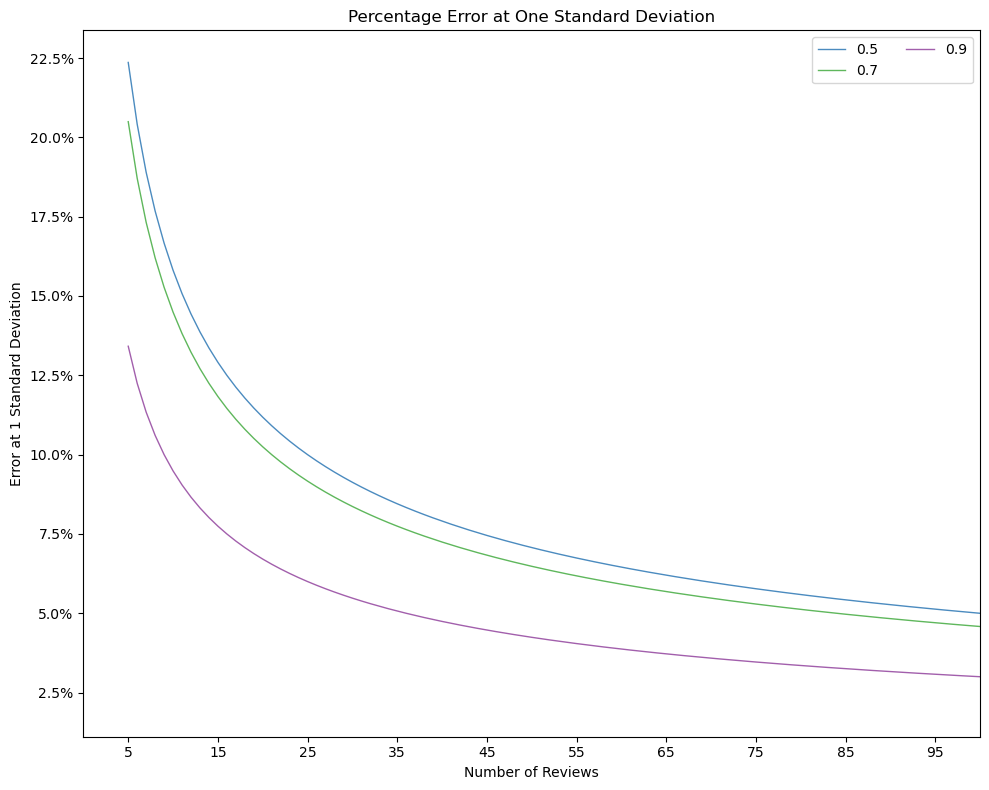

In [19]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

n = range(5, 201)
p = [0.5, 0.7, 0.9]

def binomial_variance(n, p):
    return n * p * (1 - p)

# Calculate one standard deviation accuracy
one_sd_accuracy_dict = {}
for i in p:
    one_sd_accuracy = []
    for j in n:
        sd = np.sqrt(binomial_variance(j, i))
        one_sd_accuracy.append((sd / j) * 100)
    one_sd_accuracy_dict[i] = one_sd_accuracy
    
one_sd_accuracy_data = pd.DataFrame(one_sd_accuracy_dict)
one_sd_accuracy_data['reviews'] = range(5, len(one_sd_accuracy_data) + 5)


plt.style.use('default')
palette = plt.get_cmap('Set1')

plt.figure(figsize=(10, 8))  # Create two subplots side by side

num = 0
for column in one_sd_accuracy_data.drop(columns='reviews'):
    num += 1
    plt.plot(one_sd_accuracy_data['reviews'], one_sd_accuracy_data[column], marker='', color=palette(num), linewidth=1, alpha=0.9, label=column)

plt.legend(loc=1, ncol=2)

plt.title("Percentage Error at One Standard Deviation", fontsize=12)
plt.xlabel("Number of Reviews")
plt.ylabel("Error at 1 Standard Deviation")
plt.xlim(0, 100)
plt.xticks(range(5, 100, 10))


# Format y-axis ticks as percentages
formatter = FuncFormatter(lambda x, _: '{:.1f}%'.format(x))
plt.gca().yaxis.set_major_formatter(formatter)

# Show the graphs
plt.tight_layout()
plt.show()

The graph above shows how, based on the assumption of an average 'rate of reviews' (50%, 70%, 90%) on airbnb, the accuracy of the 'number of reviews' feature quickly increases as the number of reviews increases. The three different lines represent the assumed proportion (50%, 70% and 90%) of people who leave a review on airbnb. For example, for listings with only 5 reviews, the number of reviews should be within an accuracy of ~20% for 68% of listings, assuming a 70% review rate (green line), and for listings with 45 reviews, the number of reviews should be within an accuracy of 7% for 68% of listings, assuming a 50% review rate (blue line). We'll remove listings with less than 25 reviews, however there is no single 'correct' value.

In [20]:
filtered_listings1 = listings3.query("first_review < '2023-6-23'")
filtered_listings2 = filtered_listings1.query("number_of_reviews >=25")
filtered_listings3 = filtered_listings2.query("number_of_reviews_ltm > 1")
filtered_listings4 = filtered_listings3.query("minimum_nights < 6")

# Transforming Reviews Per Month
The reviews per month column is currently an innaccurate measurement in determining a listings 'real' reviews per month. Listings that have existed for a long time are likely to take breaks, which will affect this measurement. We need to take these breaks into account. To do this we'll use the review data.

In [21]:
reviews1 = reviews.merge(filtered_listings4[['id', 'list_number', 'minimum_nights', 'number_of_reviews', 'reviews_per_month']], on = 'id', how = 'inner')

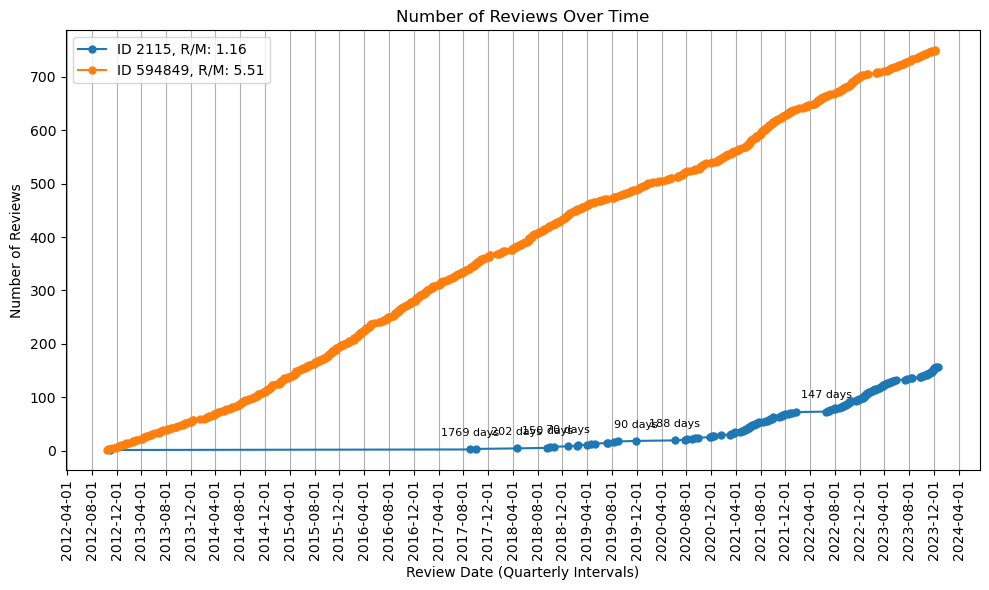

In [22]:
def plot_gaps_for_ids_count(df, id_values):
    plt.figure(figsize=(10, 6))
    
    for id_value in id_values:
        # Filter DataFrame for the specified ID
        id_df = df[df['id'] == id_value]
        
        # Sort the dates for the specified ID
        sorted_dates = id_df['date'].sort_values()
        reviews_per_month = id_df['reviews_per_month'].iloc[0]
        # Calculate the gap between consecutive dates
        gaps = [(sorted_dates.iloc[i] - sorted_dates.iloc[i - 1]).days for i in range(1, len(sorted_dates))]
        
        # Plot the dates
        plt.plot(sorted_dates, range(1, len(sorted_dates) + 1), marker='o', linestyle='-', markersize=5, label=f'ID {id_value}, R/M: {reviews_per_month}')
        
        # Plot annotations for gaps
        for i, gap in enumerate(gaps):
            if gap > 60:
                plt.annotate(f'{gap} days', xy=(sorted_dates.iloc[i+1], i+1), xytext=(0, 10), textcoords='offset points', ha='center', fontsize=8)

    # Format x-axis to show dates with fewer labels
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set the interval to 3 months
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.xticks(rotation=90, ha='center')
    plt.xlabel('Review Date (Quarterly Intervals)')
    plt.ylabel('Number of Reviews')
    plt.title('Number of Reviews Over Time')
    plt.grid(axis='x')  # Show grid only on x-axis
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage: plot gaps for IDs 1 and 2
plot_gaps_for_ids_count(reviews1, [2115, 594849])

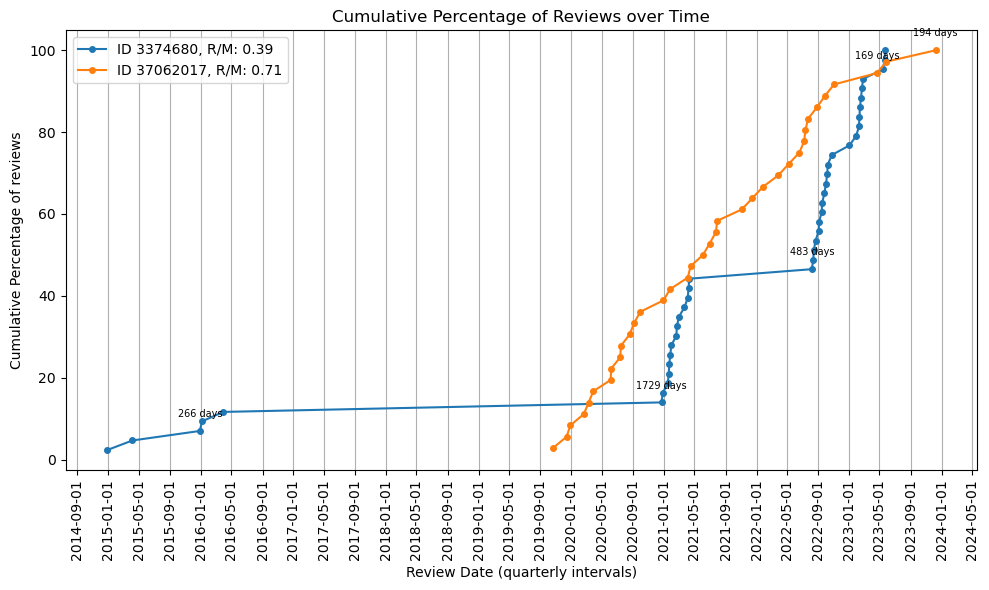

In [23]:
def plot_gaps_for_ids_cf(df, id_values):
    plt.figure(figsize=(10, 6))
    
    for id_value in id_values:
        # Filter DataFrame for the specified ID
        id_df = df[df['id'] == id_value]
        
        # Sort the dates for the specified ID
        sorted_dates = id_df['date'].sort_values()
        # Calculate the cumulative fraction of dates for each ID
        cumulative_fraction = [(i + 1) / len(sorted_dates) * 100 for i in range(len(sorted_dates))]
        reviews_per_month = id_df['reviews_per_month'].iloc[0]
        # Plot the dates
        plt.plot(sorted_dates, cumulative_fraction, marker='o', linestyle='-', markersize=4, label=f'ID {id_value}, R/M: {reviews_per_month}')
        
        # Plot annotations for gaps
        for i in range(1, len(sorted_dates)):
            gap = (sorted_dates.iloc[i] - sorted_dates.iloc[i - 1]).days
            if gap > 100:
                plt.annotate(f'{gap} days', xy=(sorted_dates.iloc[i], cumulative_fraction[i]), xytext=(0, 10), textcoords='offset points', ha='center', fontsize=7)

    # Format x-axis to show dates with fewer labels
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=4))  # Set the interval to 3 months
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.xticks(rotation=90, ha='center')
    plt.xlabel('Review Date (quarterly intervals)')
    plt.ylabel('Cumulative Percentage of reviews')
    plt.title('Cumulative Percentage of Reviews over Time')
    plt.grid(axis='x')  # Show grid only on x-axis
    plt.legend()
    plt.tight_layout()
    plt.show()
    
plot_gaps_for_ids_cf(reviews1, [3374680, 37062017])


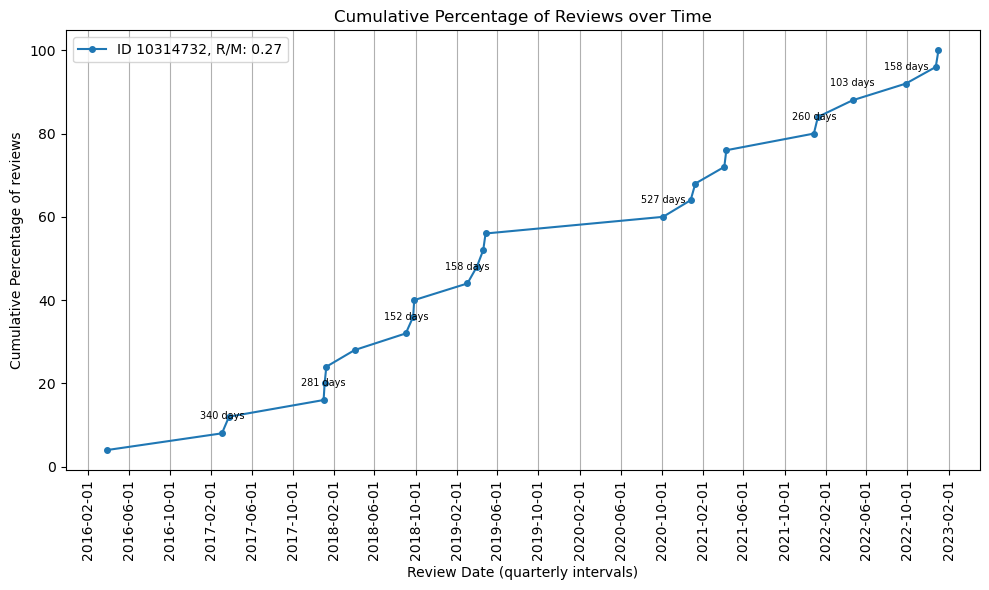

In [24]:
plot_gaps_for_ids_cf(reviews1, [10314732])

In the plot, we can see how one listing has been active from the time between its first and last reviews, while the other listing has taken multiple year breaks. To fix this we'll create a function to take these gaps into account, and we'll test different values for the minimum number of days to be considered as a gap.

In [25]:
reviews_dates_grouped = reviews1.groupby('id')['date'].agg(list).reset_index().rename(columns = {'date':'date_list'})

gap_value_range = range(20, 101, 10)
def calculate_days_and_gaps(data):
    dates = sorted(data['date_list'])
    total_days = (dates[-1] - dates[0]).days + 1
    gaps = [(dates[i] - dates[i - 1]).days for i in range(1, len(dates))]
    total_days_excluding_gaps = {}
    for gap_value in gap_value_range:
        total_days_excluding_gaps[f'total_days_excluding_gaps_{gap_value}'] = (
            total_days - sum(gap for gap in gaps if gap > gap_value))
    output = {'total_days': total_days}
    output.update(total_days_excluding_gaps)
    return pd.Series(output)

result = reviews_dates_grouped.apply(calculate_days_and_gaps, axis=1)
reviews_dates_grouped = pd.concat([reviews_dates_grouped, result], axis=1)

for gap_value in gap_value_range:
    reviews_dates_grouped[f'total_days_ratio_{gap_value}'] = reviews_dates_grouped['total_days'] / reviews_dates_grouped[f'total_days_excluding_gaps_{gap_value}']

reviews_dates_grouped = reviews_dates_grouped.merge(filtered_listings4[['id', 'number_of_reviews']], on = 'id', how = 'left')
reviews_dates_grouped.head()

,id,date_list,total_days,total_days_excluding_gaps_20,total_days_excluding_gaps_30,total_days_excluding_gaps_40,total_days_excluding_gaps_50,total_days_excluding_gaps_60,total_days_excluding_gaps_70,total_days_excluding_gaps_80,total_days_excluding_gaps_90,total_days_excluding_gaps_100,total_days_ratio_20,total_days_ratio_30,total_days_ratio_40,total_days_ratio_50,total_days_ratio_60,total_days_ratio_70,total_days_ratio_80,total_days_ratio_90,total_days_ratio_100,number_of_reviews
0,2115,"[2012-10-30 00:00:00, 2017-09-03 00:00:00, 201...",4072,801,1047,1078,1342,1456,1526,1526,1616,1616,5.083645,3.889207,3.777365,3.034277,2.796703,2.668414,2.668414,2.519802,2.519802,157
1,65261,"[2011-07-08 00:00:00, 2011-09-26 00:00:00, 201...",4539,2233,3125,3531,3704,3981,4112,4343,4433,4433,2.032691,1.452480,1.285472,1.225432,1.140166,1.103842,1.045130,1.023912,1.023912,322
2,88185,"[2011-04-16 00:00:00, 2011-04-25 00:00:00, 201...",4620,1429,1754,2179,2629,2838,3157,3310,3400,3588,3.233030,2.633979,2.120239,1.757322,1.627907,1.463415,1.395770,1.358824,1.287625,227
3,119422,"[2011-07-24 00:00:00, 2011-10-04 00:00:00, 201...",4504,180,229,332,463,463,598,818,900,994,25.022222,19.668122,13.566265,9.727862,9.727862,7.531773,5.506112,5.004444,4.531187,40
4,161731,"[2011-08-10 00:00:00, 2011-08-20 00:00:00, 201...",4514,987,1370,1843,2161,2441,2636,2710,2710,2901,4.573455,3.294891,2.449267,2.088848,1.849242,1.712443,1.665683,1.665683,1.556015,189


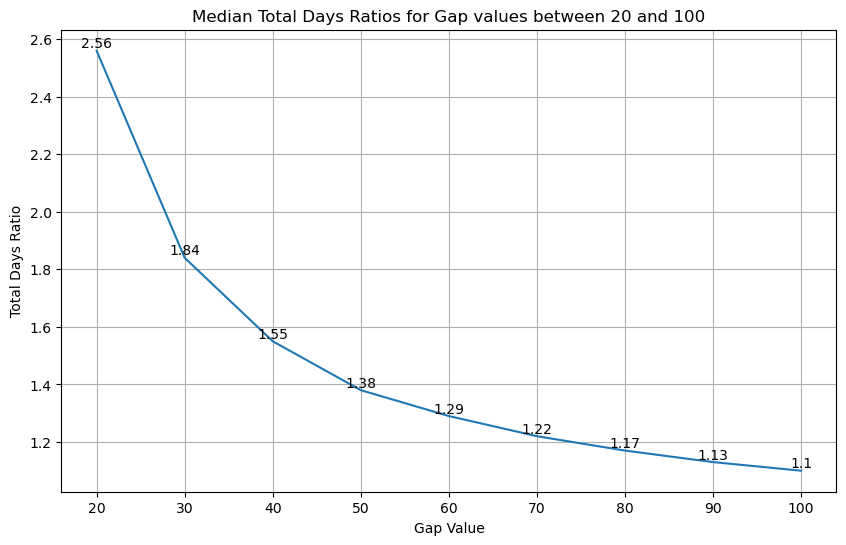

In [26]:
median_total_days_ratios = [] 

for gap_value in gap_value_range:
    median_ratio = reviews_dates_grouped.query("number_of_reviews > 10")[f'total_days_ratio_{gap_value}'].median()
    median_total_days_ratios.append(median_ratio)

median_total_days_ratios = pd.DataFrame(median_total_days_ratios).rename(columns = {0:'ratios'}).round(2)
median_total_days_ratios.set_index(pd.Index(np.arange(20, 101, 10)), inplace=True)
plt.figure(figsize=(10, 6))  
plt.plot(median_total_days_ratios['ratios'])  

for i, value in zip(range(20, 101, 10), median_total_days_ratios['ratios']):
    plt.text(i, value, f'{value}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Gap Value')
plt.ylabel('Total Days Ratio')
plt.title('Median Total Days Ratios for Gap values between 20 and 100')
plt.grid(True) 
plt.show() 

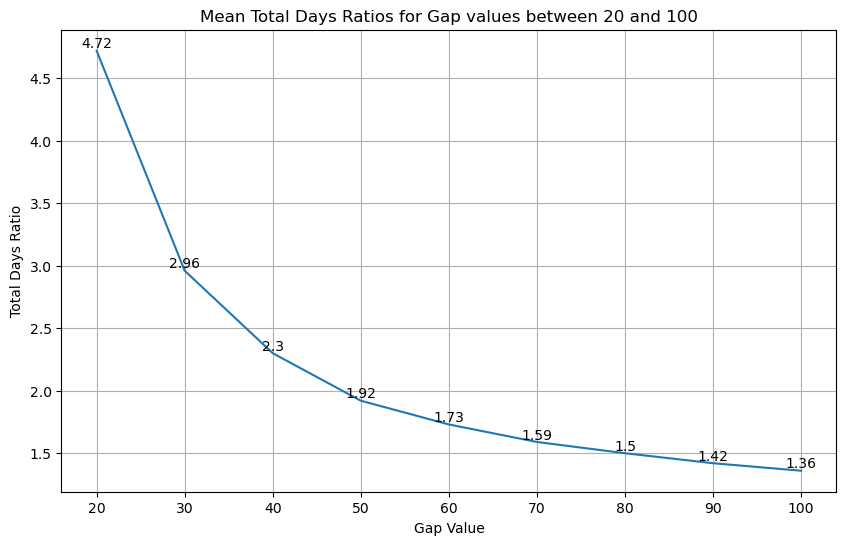

In [27]:
mean_total_days_ratios = []  

for gap_value in gap_value_range:
    mean_ratio = reviews_dates_grouped.query("number_of_reviews > 10")[f'total_days_ratio_{gap_value}'].mean()
    mean_total_days_ratios.append(mean_ratio)

mean_total_days_ratios = pd.DataFrame(mean_total_days_ratios).rename(columns = {0:'ratios'}).round(2)
mean_total_days_ratios.set_index(pd.Index(np.arange(20, 101, 10)), inplace=True)
plt.figure(figsize=(10, 6)) 
plt.plot(mean_total_days_ratios['ratios'])

for i, value in zip(range(20, 101, 10), mean_total_days_ratios['ratios']):
    plt.text(i, value, f'{value}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Gap Value')
plt.ylabel('Total Days Ratio')
plt.title('Mean Total Days Ratios for Gap values between 20 and 100')
plt.grid(True)
plt.show()

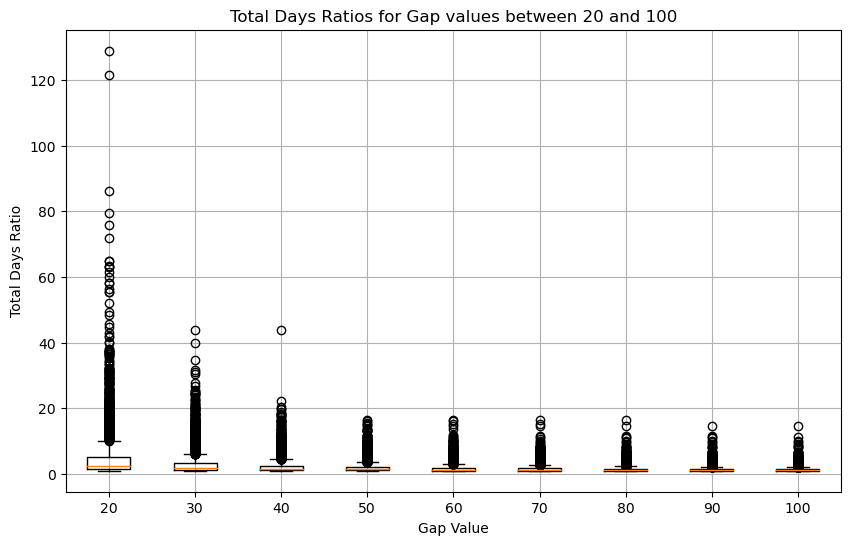

In [28]:
ratio_data = []

for gap_value in gap_value_range:
    ratio_data.append(reviews_dates_grouped[f'total_days_ratio_{gap_value}'])

plt.figure(figsize=(10, 6))
plt.boxplot(ratio_data, labels=gap_value_range)
plt.xlabel('Gap Value')
plt.ylabel('Total Days Ratio')
plt.title('Total Days Ratios for Gap values between 20 and 100')
plt.grid(True)
plt.show() 

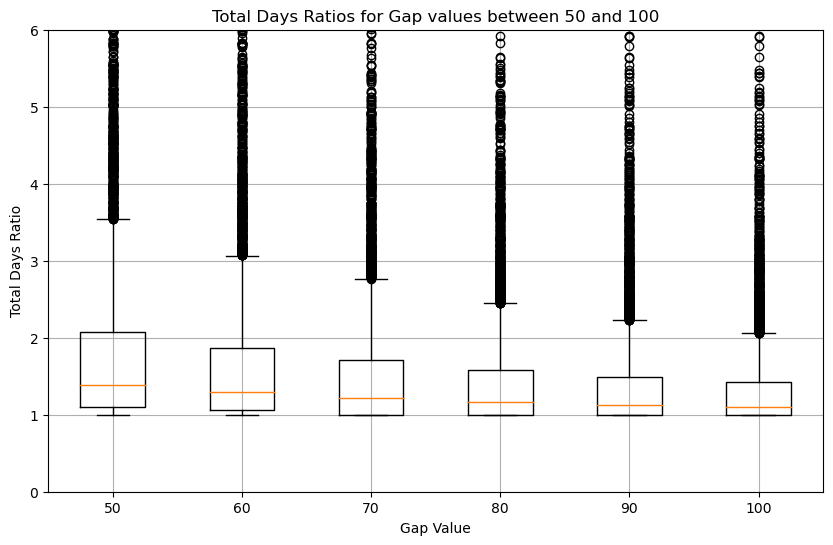

In [29]:
ratio_data1 = ratio_data[3:]
plt.figure(figsize=(10, 6))
plt.boxplot(ratio_data[3:], labels= gap_value_range[3:])
plt.xlabel('Gap Value')
plt.ylabel('Total Days Ratio')
plt.title('Total Days Ratios for Gap values between 50 and 100')
plt.grid(True)
plt.ylim(0, 6)
plt.show()

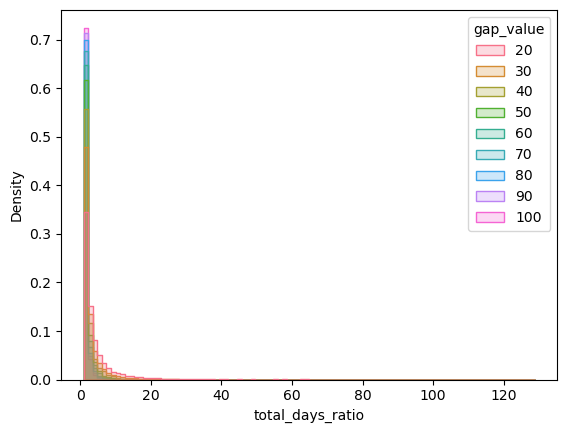

In [30]:
ratio_data_transposed = pd.DataFrame(ratio_data).transpose()
ratio_data_transposed = ratio_data_transposed.rename(columns={'total_days_ratio_20':'20',
                          'total_days_ratio_30':'30',
                          'total_days_ratio_40':'40',
                          'total_days_ratio_50':'50',
                          'total_days_ratio_60':'60',
                          'total_days_ratio_70':'70',
                          'total_days_ratio_80':'80',
                          'total_days_ratio_90':'90',
                          'total_days_ratio_100':'100'})
ratio_data_melted = ratio_data_transposed.melt(var_name='gap_value', value_name='total_days_ratio')
ratio_data_melted.gap_value = ratio_data_melted.gap_value.astype(int)
ratio_data_melted

palette = sns.color_palette("husl", len(ratio_data_melted['gap_value'].unique()))
sns.histplot(
    ratio_data_melted[(ratio_data_melted['gap_value'] > 10) & (ratio_data_melted['total_days_ratio'] > 0)], 
    x="total_days_ratio", hue="gap_value", element="step",
    stat="density", common_norm=False, bins=100, palette = palette)
plt.show()


#sns.violinplot(x='gap_value', y='total_days_ratio', data=ratio_data_melted[ratio_data_melted['gap_value'] > 40])
#plt.title('Total Days Ratios for Gap values between 50 and 100')
#plt.ylim(1, 3)
#plt.show()

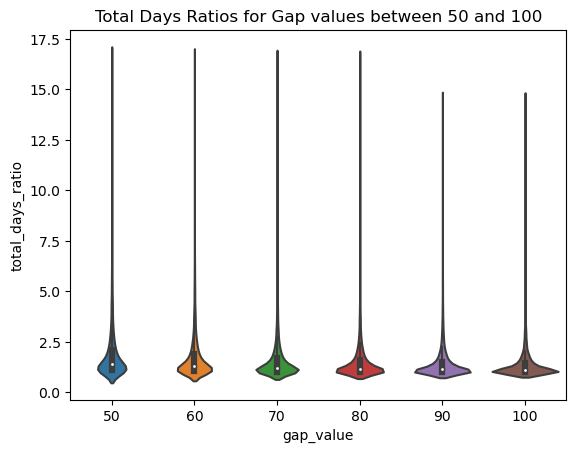

In [31]:
sns.violinplot(x='gap_value', y='total_days_ratio', data=ratio_data_melted[ratio_data_melted['gap_value'] > 40])
plt.title('Total Days Ratios for Gap values between 50 and 100')
plt.show()

The above plots (not the violin and hist one) show us how different minimum values for what is considered as a gap drastically affects our results. At a minimum value of 20, some listings will have their reviews per month value multipled one hundred fold. Larger values become more stable, and at around 50 we're left with much more reasonable values. We'll select a value of 60 i.e. 2 months as our gap threshold.

In [32]:
reviews_dates_grouped.query('number_of_reviews < 200')[['id','total_days', 'total_days_excluding_gaps_60', 'total_days_ratio_60', 'number_of_reviews']].sort_values(by = 'number_of_reviews', ascending = False).head(100)

reviews_dates_grouped.query('300 > number_of_reviews > 170 & total_days > 1200')[['id','total_days',
                       'total_days_excluding_gaps_60',
                       'total_days_ratio_60',
                       'number_of_reviews']].sort_values(by = 'total_days_ratio_60', ascending = False).head(100)


reviews_dates_grouped.sort_values(by = 'number_of_reviews')


,id,date_list,total_days,total_days_excluding_gaps_20,total_days_excluding_gaps_30,total_days_excluding_gaps_40,total_days_excluding_gaps_50,total_days_excluding_gaps_60,total_days_excluding_gaps_70,total_days_excluding_gaps_80,total_days_excluding_gaps_90,total_days_excluding_gaps_100,total_days_ratio_20,total_days_ratio_30,total_days_ratio_40,total_days_ratio_50,total_days_ratio_60,total_days_ratio_70,total_days_ratio_80,total_days_ratio_90,total_days_ratio_100,number_of_reviews
4216,51024505,"[2021-09-29 00:00:00, 2021-10-02 00:00:00, 202...",650,93,145,215,215,215,283,438,527,527,6.989247,4.482759,3.023256,3.023256,3.023256,2.296820,1.484018,1.233397,1.233397,25
5342,824291836594667458,"[2023-03-26 00:00:00, 2023-03-30 00:00:00, 202...",268,165,165,203,203,203,268,268,268,268,1.624242,1.624242,1.320197,1.320197,1.320197,1.000000,1.000000,1.000000,1.000000,25
4142,50188779,"[2021-07-16 00:00:00, 2021-07-27 00:00:00, 202...",858,137,243,319,319,375,375,454,538,538,6.262774,3.530864,2.689655,2.689655,2.288000,2.288000,1.889868,1.594796,1.594796,25
399,6980898,"[2015-10-04 00:00:00, 2016-01-10 00:00:00, 201...",2985,121,121,195,195,195,195,274,274,372,24.669421,24.669421,15.307692,15.307692,15.307692,15.307692,10.894161,10.894161,8.024194,25
4159,50361430,"[2021-08-21 00:00:00, 2021-09-29 00:00:00, 202...",770,167,188,267,267,267,267,267,267,365,4.610778,4.095745,2.883895,2.883895,2.883895,2.883895,2.883895,2.883895,2.109589,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1064,16006658,"[2017-02-25 00:00:00, 2017-03-06 00:00:00, 201...",2487,2439,2439,2439,2487,2487,2487,2487,2487,2487,1.019680,1.019680,1.019680,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,792
745,11896294,"[2016-03-25 00:00:00, 2016-04-28 00:00:00, 201...",2830,2601,2622,2656,2656,2707,2707,2707,2707,2707,1.088043,1.079329,1.065512,1.065512,1.045438,1.045438,1.045438,1.045438,1.045438,812
879,14111398,"[2016-08-09 00:00:00, 2016-08-15 00:00:00, 201...",2560,2473,2520,2560,2560,2560,2560,2560,2560,2560,1.035180,1.015873,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,816
54,1201497,"[2013-06-05 00:00:00, 2013-06-07 00:00:00, 201...",3826,3174,3255,3462,3462,3462,3529,3529,3529,3628,1.205419,1.175422,1.105142,1.105142,1.105142,1.084160,1.084160,1.084160,1.054576,973


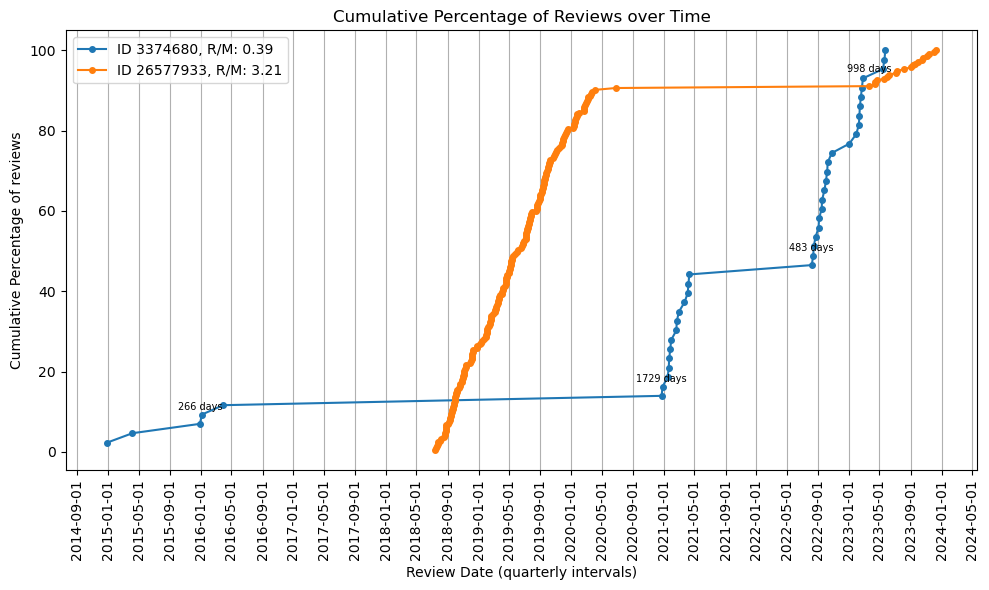

In [33]:
plot_gaps_for_ids_cf(reviews1, [3374680,26577933])

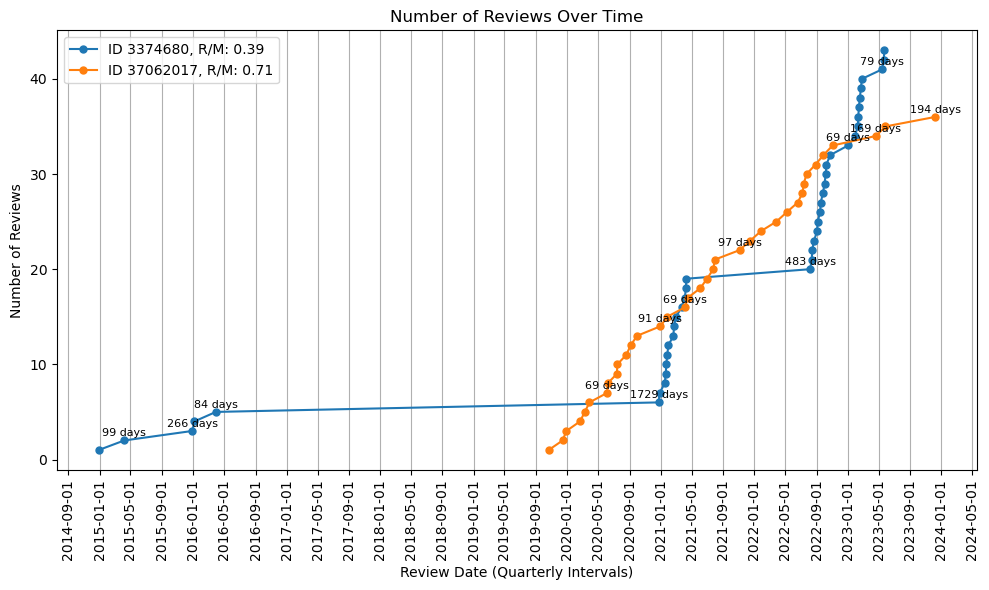

In [34]:
plot_gaps_for_ids_count(reviews1, [3374680, 37062017])

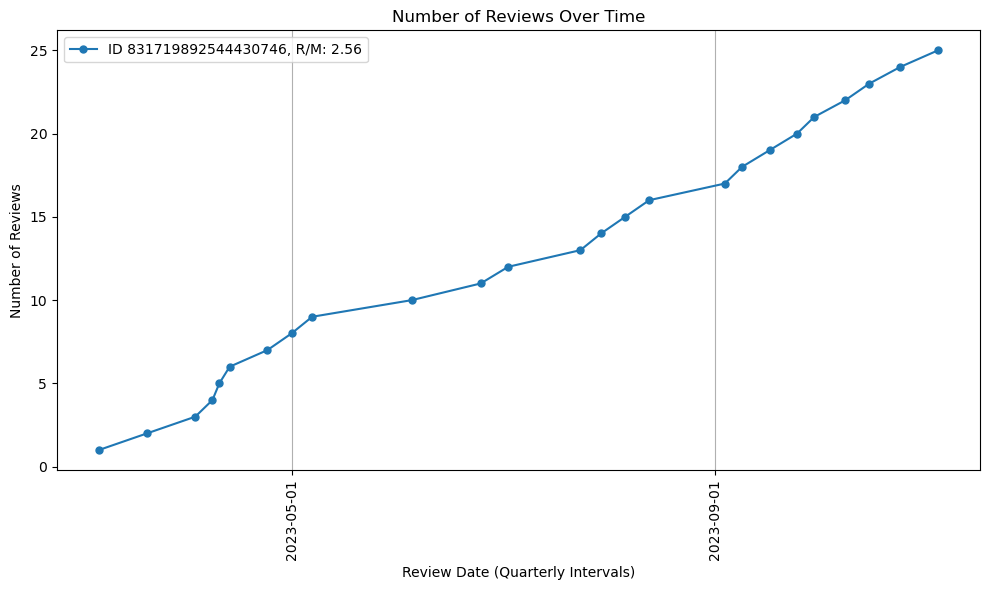

In [35]:
plot_gaps_for_ids_count(reviews1, [831719892544430746])

In [36]:
filtered_listings4 = filtered_listings4.merge(reviews_dates_grouped[['id', 'total_days_ratio_60']], on = 'id', how = 'left')
filtered_listings4['reviews_per_month_transformed']  = filtered_listings4['total_days_ratio_60']*filtered_listings4['reviews_per_month']
filtered_listings4['review_price_product'] = filtered_listings4['price']*filtered_listings4['reviews_per_month_transformed']
#create a sigmoid type function as a scale for number of reviews
filtered_listings4['number_of_reviews_scaled'] = 2*(1/(1+np.exp(-0.01*filtered_listings4['number_of_reviews']))-.5)

Next we'll remove any listings with too high of a ratio.

In [37]:
#visualizing distribution of total days ratio with a threshold of 60
fig = px.scatter(filtered_listings4, x='total_days_ratio_60', y='number_of_reviews', size = 'review_price_product', color='reviews_per_month_transformed',
                  hover_name='id',
                 labels={'number_of_reviews': 'Number of Reviews', 'reviews_per_month': 'Reviews per Month'},
                 title='Scatter Plot with Four Variables',color_continuous_scale = 'RdYlBu_r')

# Customize the figure
fig.update_traces(marker=dict(opacity=0.9))
fig.update_layout(width=1000, height=1000)

# Show the plot
fig.show()

In the above graph we can see how listings with the highest total days ratio (for a threshold of 60) are also the listings with the lowest number of reviews. These listings are already likely to be noisy, and they should be removed.

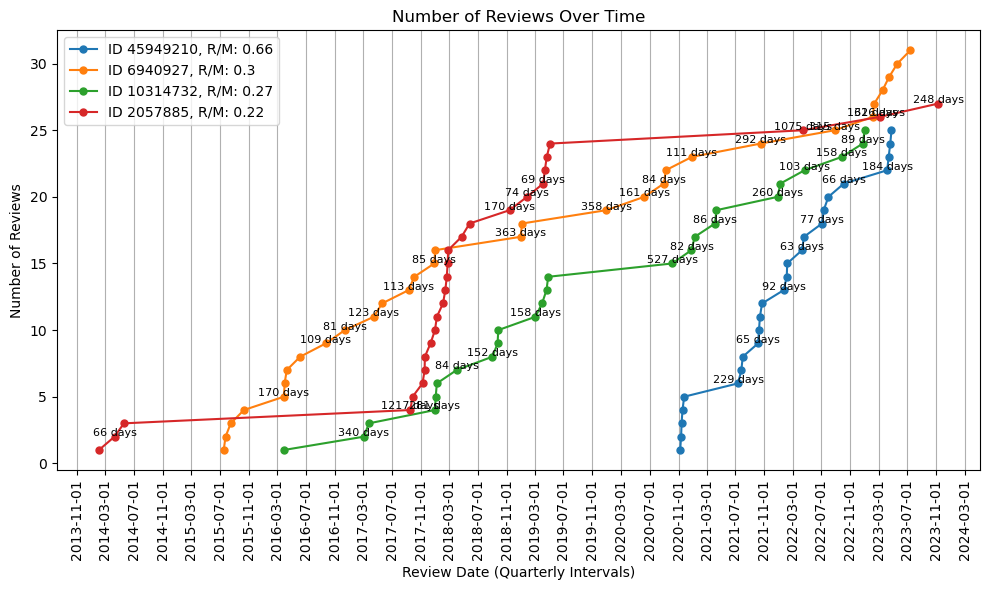

In [38]:
#2nd visualization
#look at listings with a ratio greater than 6
filtered_listings4.query('total_days_ratio_60 >= 6').id.values
plot_gaps_for_ids_count(reviews1, [45949210,  6940927, 10314732,  2057885])

We'll select a value of 6 as our threshold 

In [39]:
filtered_listings4 = filtered_listings4.query("total_days_ratio_60 < 6")

In [40]:
fig = px.scatter(filtered_listings4, x='reviews_per_month_transformed', y='price', size = 'review_price_product', color='number_of_reviews_scaled',
                  hover_name='id',
                 labels={'number_of_reviews': 'Number of Reviews', 'reviews_per_month': 'Reviews per Month'},
                 title='Scatter Plot with Four Variables',color_continuous_scale = 'RdYlBu_r')

# Customize the figure
fig.update_traces(marker=dict(opacity=0.9))
fig.update_layout(width=1000, height=1000)

# Show the plot
fig.show()

we'll hover over points on the plotly graph and use the id values to correct any outliers

In [41]:
filtered_listings4.query('id == 36809281')[['listing_url', 'price','price_old', 'price_old2', 'minimum_nights', 'reviews_per_month_transformed', 'reviews_per_month']]

,listing_url,price,price_old,price_old2,minimum_nights,reviews_per_month_transformed,reviews_per_month
4953,https://www.airbnb.com/rooms/36809281,2000.0,1736.0,1564.0,3,1.739517,1.02


In [42]:
#fix incorrect price of outliers using listing url
filtered_listings4.loc[filtered_listings4['id'] == 23240988, 'price'] = 270
filtered_listings4.loc[filtered_listings4['id'] == 23240988, 'review_price_product'] = filtered_listings4.loc[filtered_listings4['id'] == 23240988, 'price'] * filtered_listings4.loc[filtered_listings4['id'] == 23240988, 'reviews_per_month_transformed']

filtered_listings4.loc[filtered_listings4['id'] == 10937100, 'price'] = 300
filtered_listings4.loc[filtered_listings4['id'] == 10937100, 'review_price_product'] = filtered_listings4.loc[filtered_listings4['id'] == 10937100, 'price'] * filtered_listings4.loc[filtered_listings4['id'] == 10937100, 'reviews_per_month_transformed']

# Minimum Nights Coefficient
Minimum nights will be an important variable when calculating a listings success. Listings with higher minimum nights values will, on average, recieve less reviews per month, however each review will account for a longer booking. 

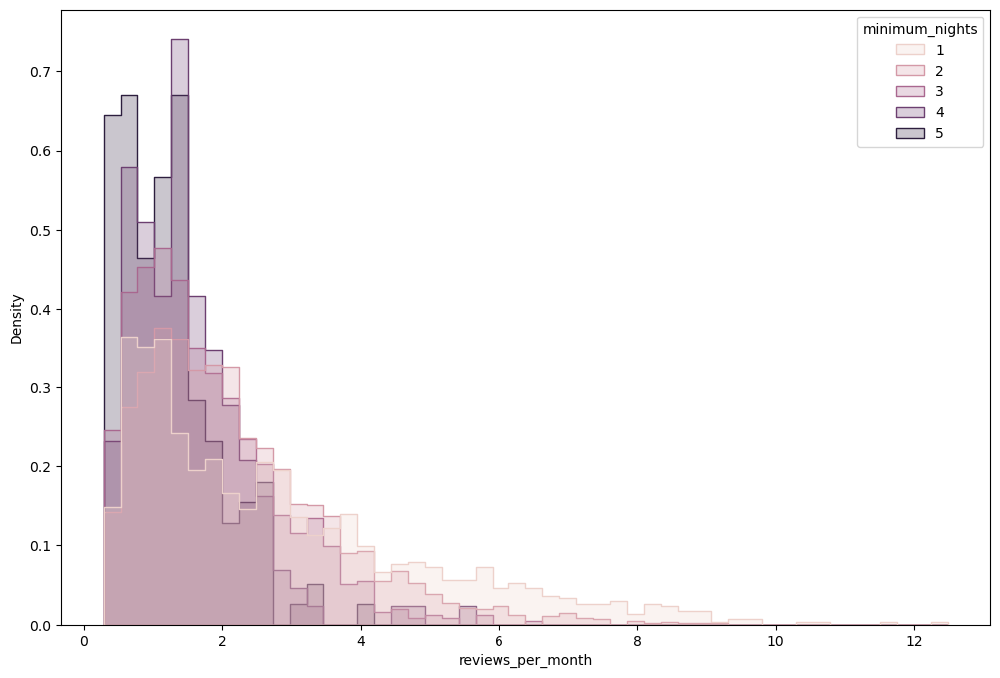

minimum_nights
2    2761
1    1237
3    1032
4     177
5     159
Name: count, dtype: int64

In [43]:
filtered_listings4[['minimum_nights', 'id', 'number_of_reviews', 'reviews_per_month']]
plt.figure(figsize=(12, 8))
sns.histplot(
    filtered_listings4, 
    x="reviews_per_month", hue="minimum_nights", element="step",
    stat="density", common_norm=False, bins=50, #palette = palette)
)
plt.show()

filtered_listings4[['minimum_nights', 'id', 'number_of_reviews', 'reviews_per_month']].minimum_nights.value_counts()

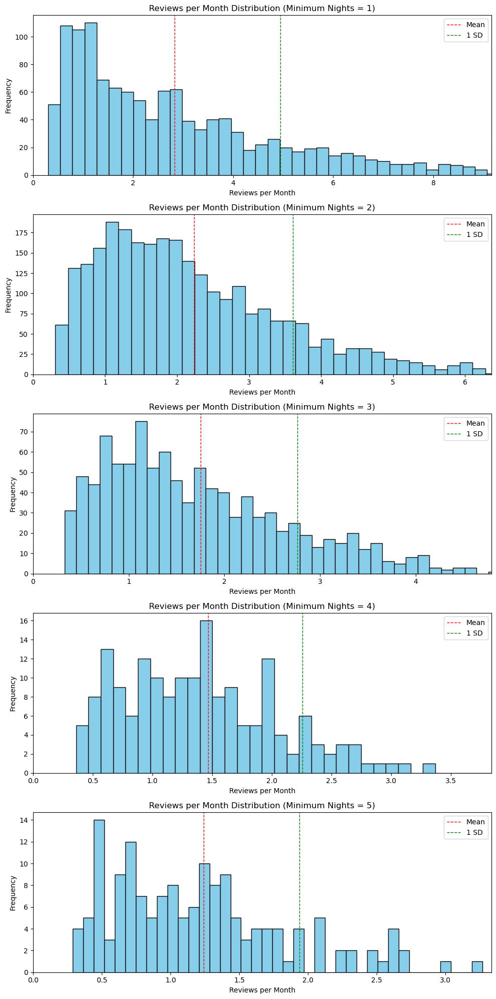

In [44]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(5, 1, figsize=(10, 20))

for i, min_nights in enumerate(range(1, 6)):
    filtered_data = filtered_listings4.query(f'minimum_nights == {min_nights}')
    axs[i].hist(filtered_data['reviews_per_month'], bins=50, color='skyblue', edgecolor='black')
    mean_value = filtered_data['reviews_per_month'].mean()
    std_value = filtered_data['reviews_per_month'].std()
    three_std = 3*std_value
    axs[i].axvline(mean_value, color='red', linestyle='dashed', linewidth=1, label='Mean')
    axs[i].axvline(mean_value + std_value, color='green', linestyle='dashed', linewidth=1, label='1 SD')
    axs[i].axvline(mean_value + three_std, color='orange', linestyle='dashed', linewidth=1)
    axs[i].set_title(f'Reviews per Month Distribution (Minimum Nights = {min_nights})')
    axs[i].set_xlabel('Reviews per Month')
    axs[i].set_ylabel('Frequency')
    axs[i].set_xlim(0, mean_value + three_std)
    axs[i].legend()

plt.tight_layout()
plt.show()

Seems to be an excessive amount of listings recieving very few review per month for minimum nights = 1. It's possible its 
due to recieving little attention, so minimum nights is reduced to 1 in an attemptattract more attention

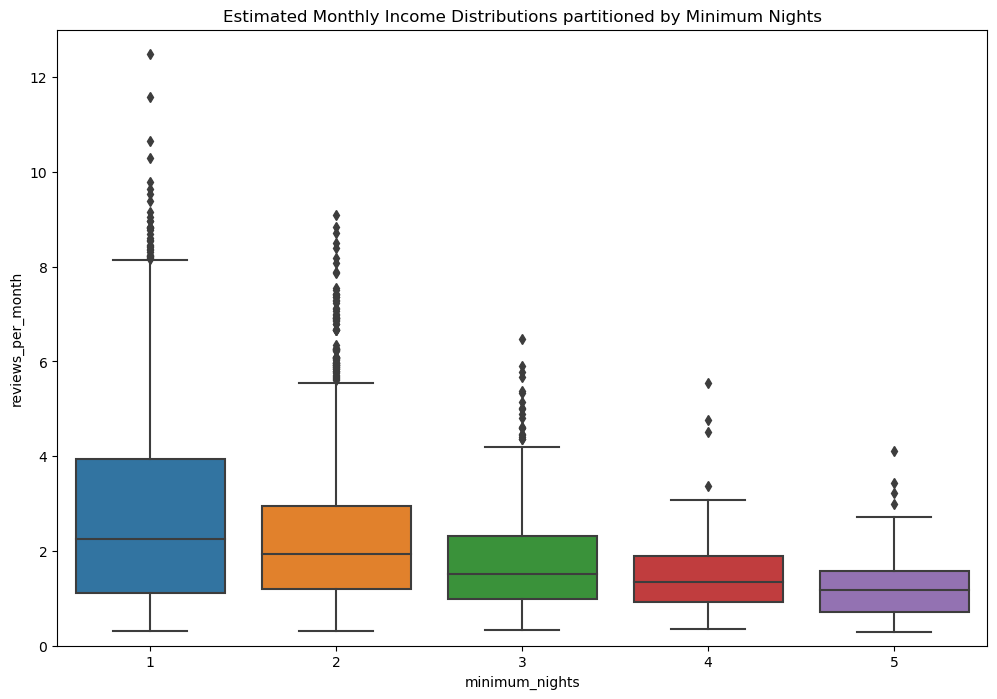

Average reviews per month for minimum nights = 1: 2.8287388843977364
Average reviews per month for minimum nights = 2: 2.233850054328142
Average reviews per month for minimum nights = 3: 1.7518313953488374
Average reviews per month for minimum nights = 4: 1.4671751412429375
Average reviews per month for minimum nights = 5: 1.240566037735849
1.265902141563787
1.6136459297248367
1.9351711107817002
2.2887111311585655


2.8287388843977364

In [45]:
#just analyzing the data
plt.figure(figsize=(12, 8))
sns.boxplot(x='minimum_nights', y='reviews_per_month', data=filtered_listings4)
plt.title('Estimated Monthly Income Distributions partitioned by Minimum Nights')
plt.ylim(0,13)
plt.show()

print(f"Average reviews per month for minimum nights = 1: {filtered_listings4.query('minimum_nights == 1').reviews_per_month.mean()}")
print(f"Average reviews per month for minimum nights = 2: {filtered_listings4.query('minimum_nights == 2').reviews_per_month.mean()}")
print(f"Average reviews per month for minimum nights = 3: {filtered_listings4.query('minimum_nights == 3').reviews_per_month.mean()}")
print(f"Average reviews per month for minimum nights = 4: {filtered_listings4.query('minimum_nights == 4').reviews_per_month.mean()}")
print(f"Average reviews per month for minimum nights = 5: {filtered_listings4.query('minimum_nights == 5').reviews_per_month.mean()}")

print(2.8279886914378025/2.2339710144927536)
print(2.8279886914378025/1.7525459825750243)
print(2.8279886914378025/1.4613636363636362)
print(2.8279886914378025/1.235625)

filtered_data = filtered_listings4.query(f'minimum_nights == 1')
filtered_data['reviews_per_month'].mean()




# Adjusting based on minimum nights
unfortunately, looking at the data gives us no information on what values to use. Instead, I chose to research online, and came up with values that I deemed most likely.

Listings with minimum nights = 1 are often booked for 2-3 nights, and booking of one night are predominantly to fill space on the calendar.
listings with high values for minimum nights often permit shorter booking to fill in gaps between longer bookings, hence their true minimum nights value is not an accurate representation.

Because of this, low minimum nights values will be scaled greatly, but higher values will remain the same.

In [46]:
def income(data):
    if data['minimum_nights'] == 1:
        x = 2.5
    elif data['minimum_nights'] == 2:
        x = 3
    elif data['minimum_nights'] == 3:
        x = 3.5
    elif data['minimum_nights'] == 4:
        x = 4
    elif data['minimum_nights'] == 5:
        x = 5
    return x * data['price'] * data['reviews_per_month_transformed'] * 1.4

# Use .loc to set values in the original DataFrame
filtered_listings4.loc[:, 'estimated_monthly_income'] = filtered_listings4.apply(income, axis=1) #setting rows in a newly 

In [47]:
fig = px.scatter(filtered_listings4, x='minimum_nights', y='estimated_monthly_income', color='number_of_reviews_scaled',
                  hover_name='id',
                 labels={'number_of_reviews': 'Number of Reviews', 'reviews_per_month': 'Reviews per Month'},
                 title='Scatter Plot with Four Variables',color_continuous_scale = 'RdYlBu_r')

fig.update_traces(marker=dict(opacity=0.7))
fig.update_layout(width=1000, height=1000)

fig.show()

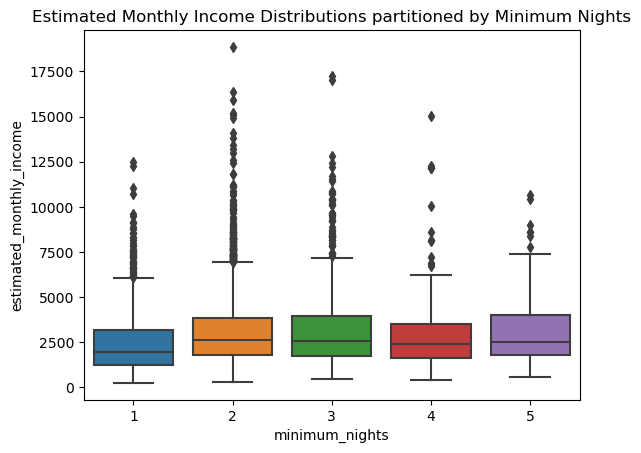

In [48]:
sns.boxplot(x='minimum_nights', y='estimated_monthly_income', data=filtered_listings4)
plt.title('Estimated Monthly Income Distributions partitioned by Minimum Nights')
plt.show()

# Analysis of Top Performing Listings

In [49]:
final_listings = filtered_listings4.copy()
final_listings.price = final_listings.price.astype(int)
final_listings.estimated_monthly_income = final_listings.estimated_monthly_income.round(0).astype(int)
final_listings.reviews_per_month_transformed = final_listings.reviews_per_month_transformed.round(2)


In [50]:
top_listings = final_listings.sort_values(by = 'estimated_monthly_income', ascending = False).head(500)
remaining_listings = final_listings.sort_values(by = 'estimated_monthly_income', ascending = False).iloc[300:]
median_listings = final_listings.sort_values(by = 'estimated_monthly_income', ascending = False).iloc[2451:2951]
bottom_listings = final_listings.sort_values(by = 'estimated_monthly_income', ascending = False).tail(500)

In [51]:
top_listings_min_income = top_listings.estimated_monthly_income.min()
median_listings_min_income = median_listings.estimated_monthly_income.min()
median_listings_max_income = median_listings.estimated_monthly_income.max()
bottom_listings_max_income = bottom_listings.estimated_monthly_income.max()
final_listings['listing_tier'] = ''  # Initialize the column with empty strings

for i in range(len(final_listings)):
    if final_listings.iloc[i, final_listings.columns.get_loc('estimated_monthly_income')] >= top_listings_min_income:
        final_listings.iloc[i, final_listings.columns.get_loc('listing_tier')] = 'top listing'
    elif final_listings.iloc[i, final_listings.columns.get_loc('estimated_monthly_income')] >= median_listings_min_income and final_listings.iloc[i, final_listings.columns.get_loc('estimated_monthly_income')] <= median_listings_max_income:
        final_listings.iloc[i, final_listings.columns.get_loc('listing_tier')] = 'median listing'
    elif final_listings.iloc[i, final_listings.columns.get_loc('estimated_monthly_income')] <= bottom_listings_max_income:
        final_listings.iloc[i, final_listings.columns.get_loc('listing_tier')] = 'bottom listing'
    else:
        final_listings.iloc[i, final_listings.columns.get_loc('listing_tier')] = 'no tier'
        

In [52]:
listing_tiers = final_listings.query("listing_tier != 'no tier'")

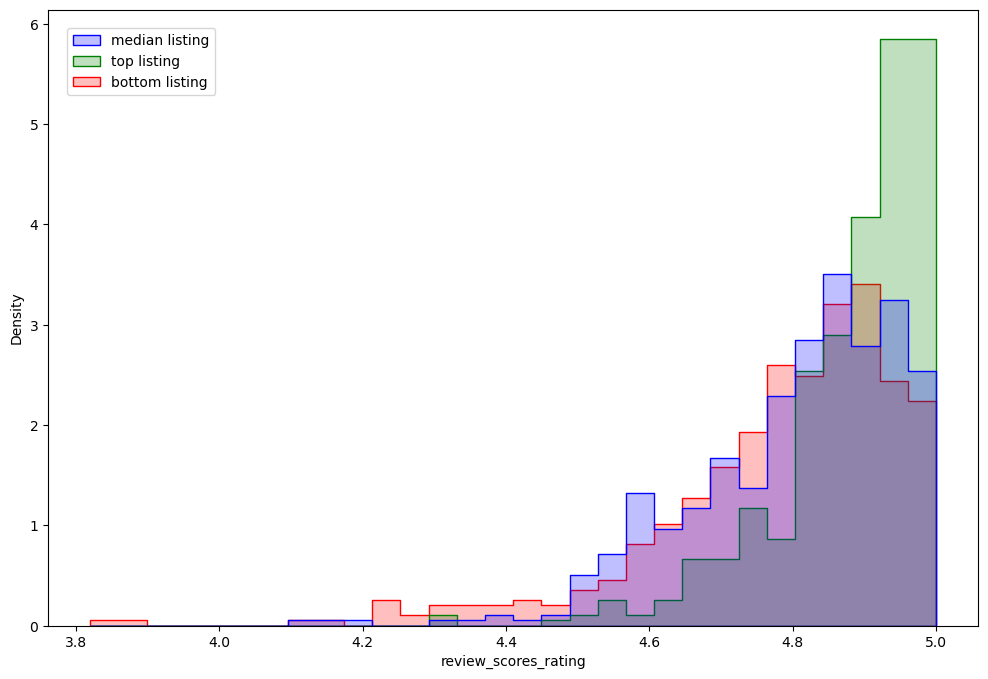

In [53]:
custom_palette = {'top listing': 'green', 'median listing': 'blue', 'bottom listing': 'red'}
plt.figure(figsize=(12, 8))
ax = sns.histplot(listing_tiers, x="review_scores_rating", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins=30, palette=custom_palette)
sns.move_legend(ax, "lower center", bbox_to_anchor=(.1, .85), ncol=1, title=None, frameon=True)
plt.show()

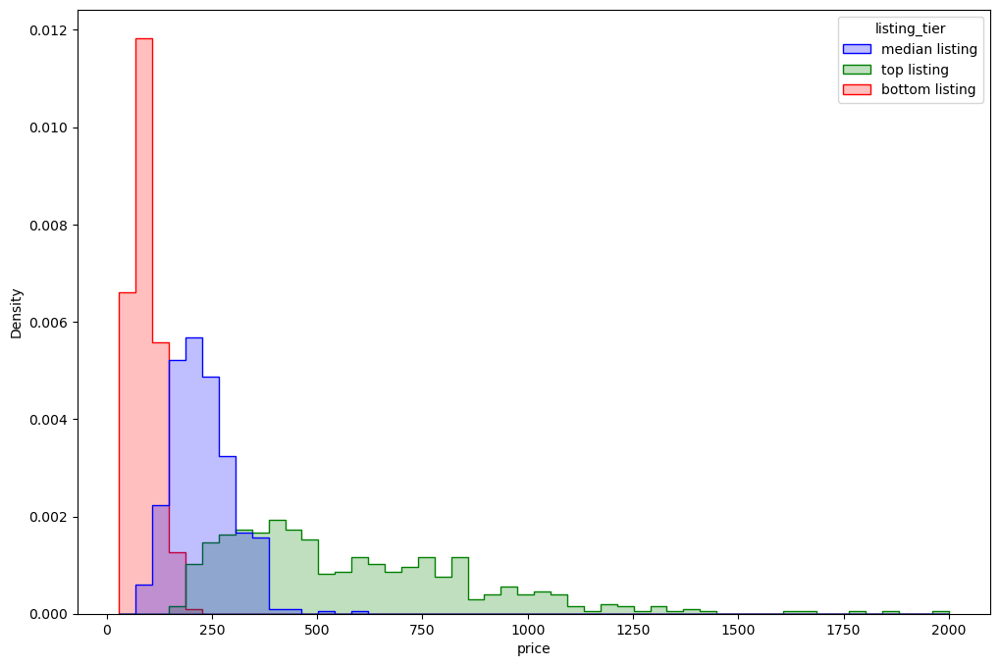

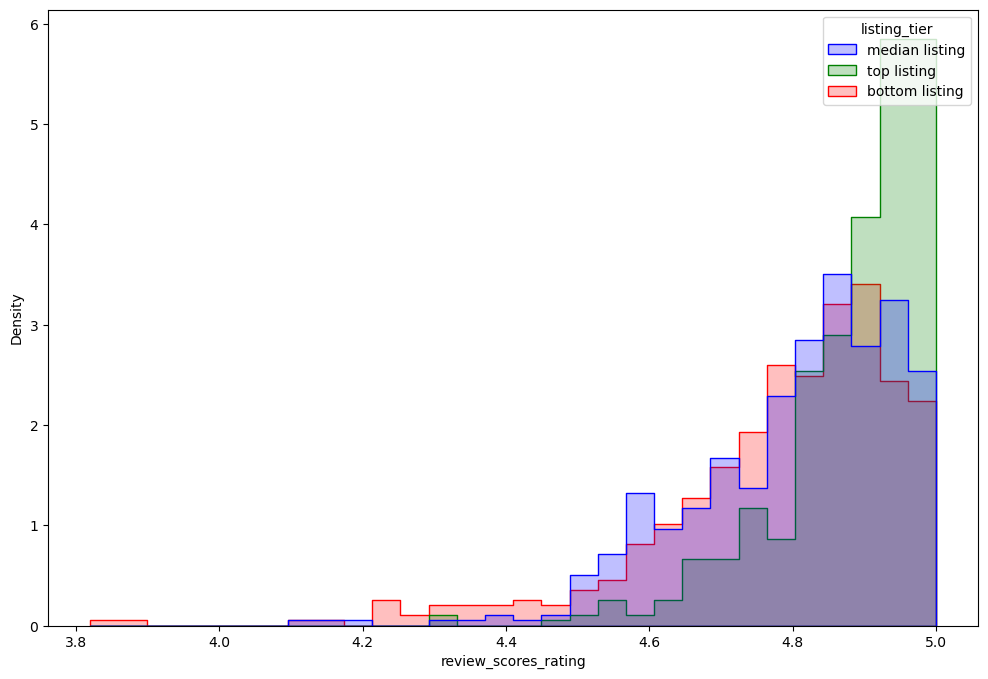

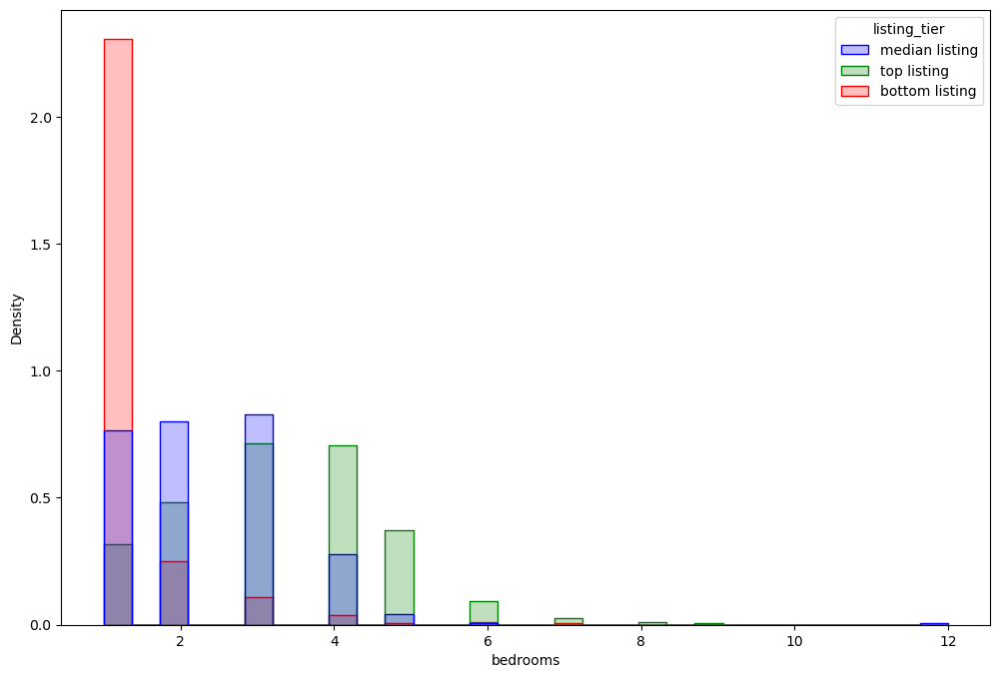

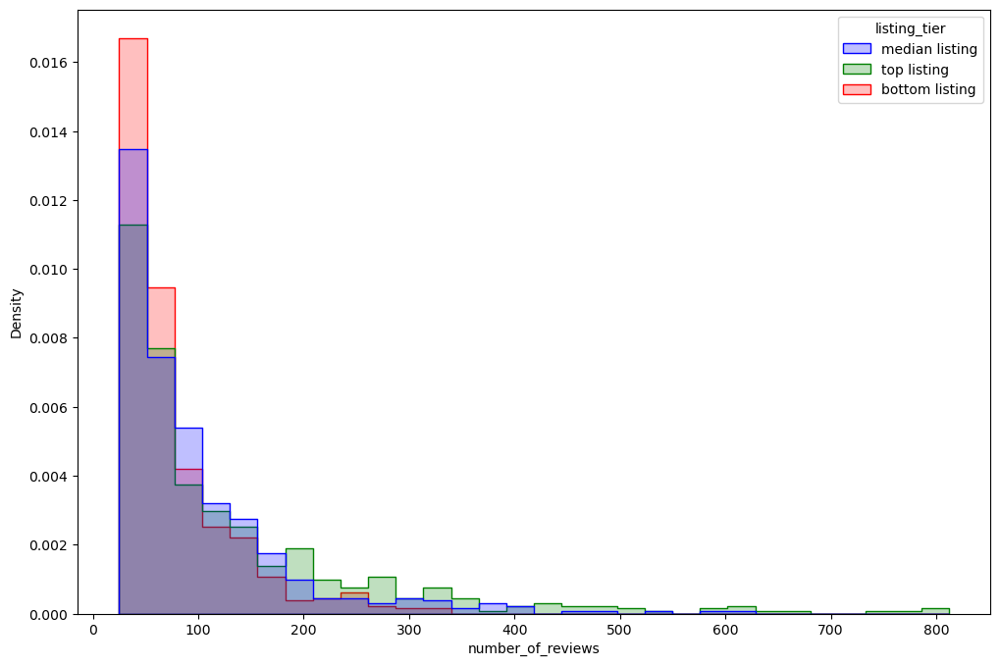

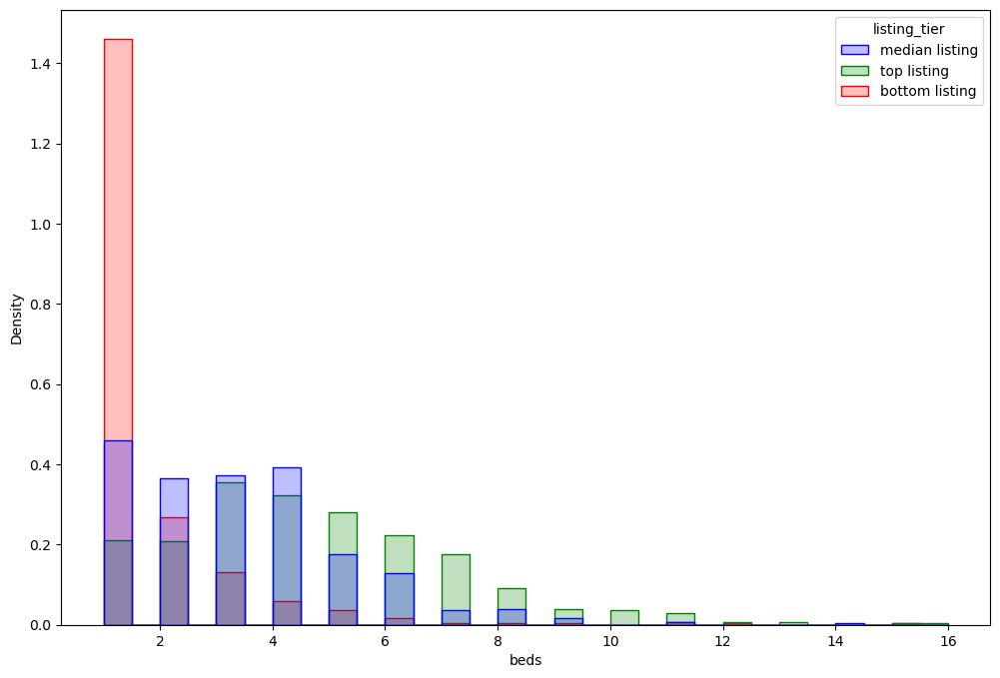

<Axes: xlabel='total_days_ratio_60', ylabel='Density'>

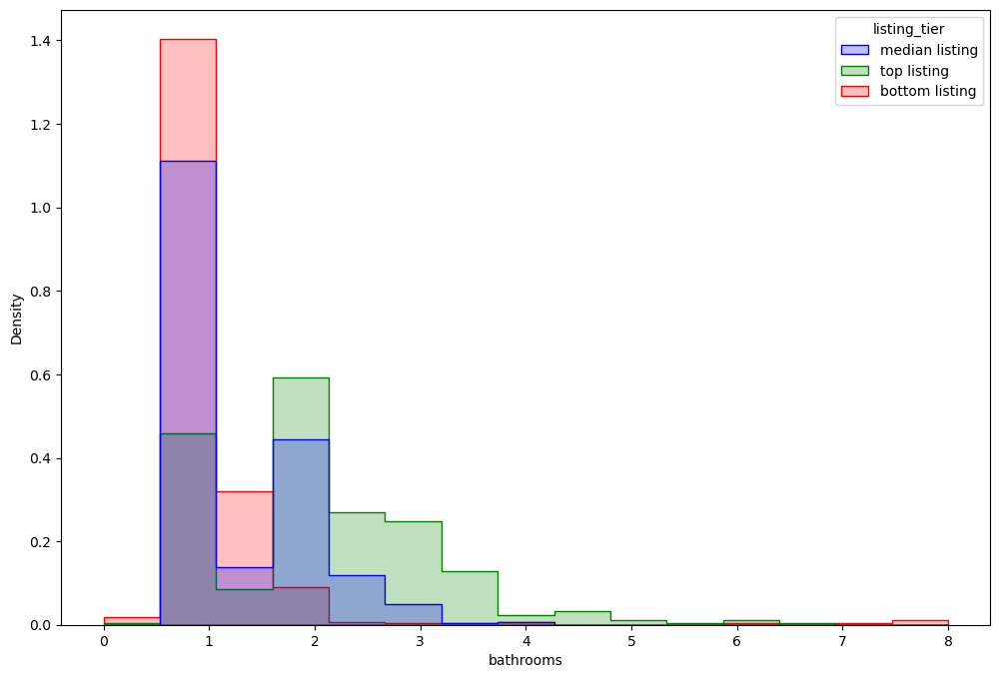

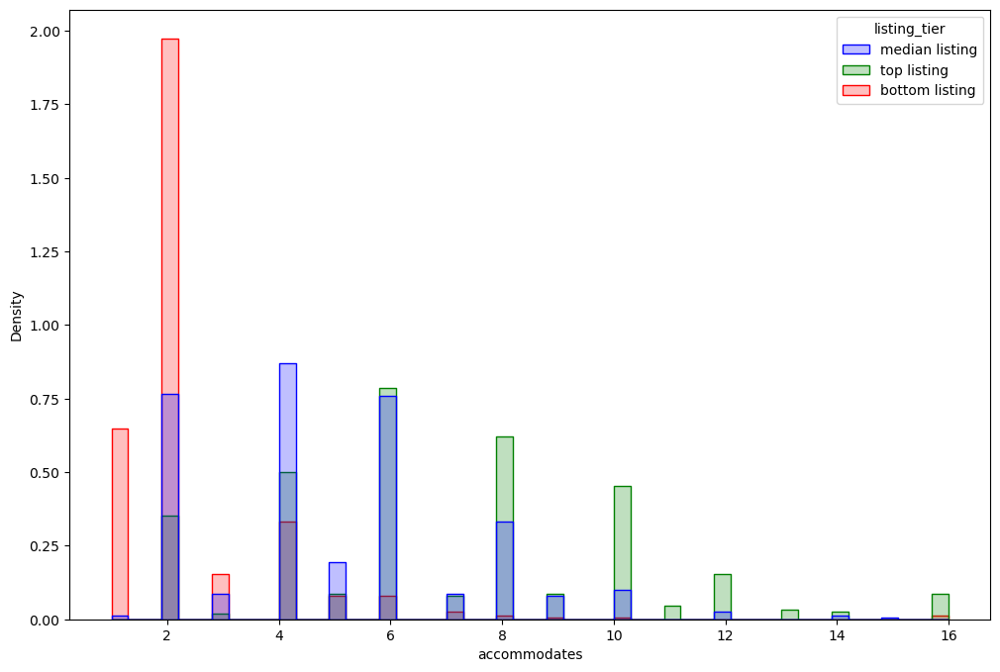

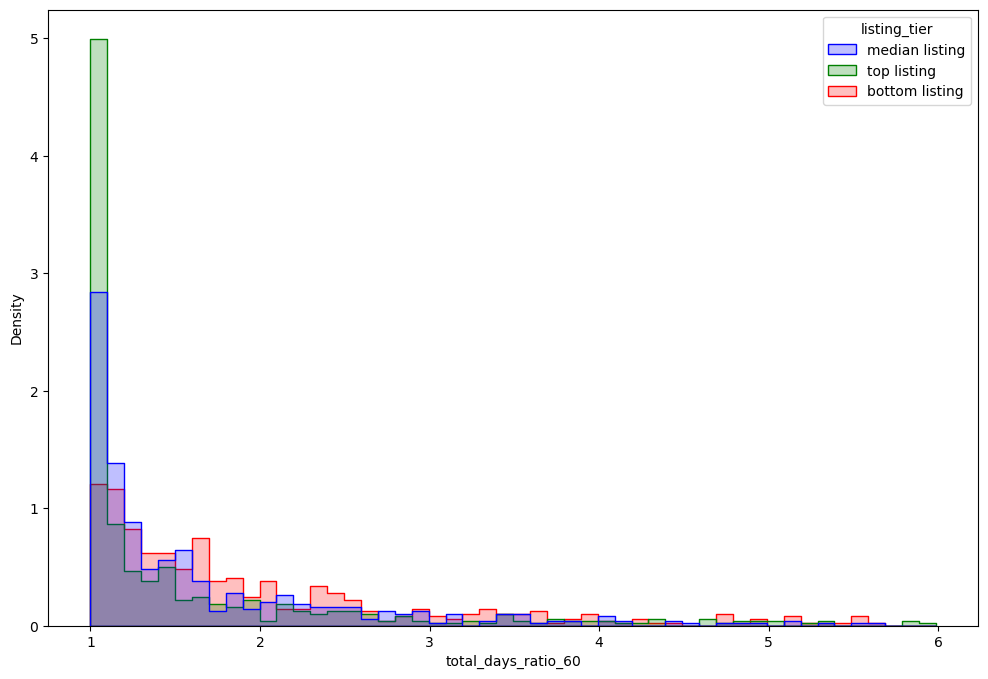

In [54]:
plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="price", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 50, palette=custom_palette)
plt.show()


plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="review_scores_rating", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 30, palette=custom_palette)
plt.show()


plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="bedrooms", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 30, palette=custom_palette)
plt.show()

                   
plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="number_of_reviews", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 30, palette=custom_palette)
plt.show()

           

plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="beds", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 30, palette=custom_palette)
plt.show()

           

plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="bathrooms", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 15, palette=custom_palette)

           

plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="accommodates", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 50, palette=custom_palette)

           

plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="total_days_ratio_60", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 50, palette=custom_palette)


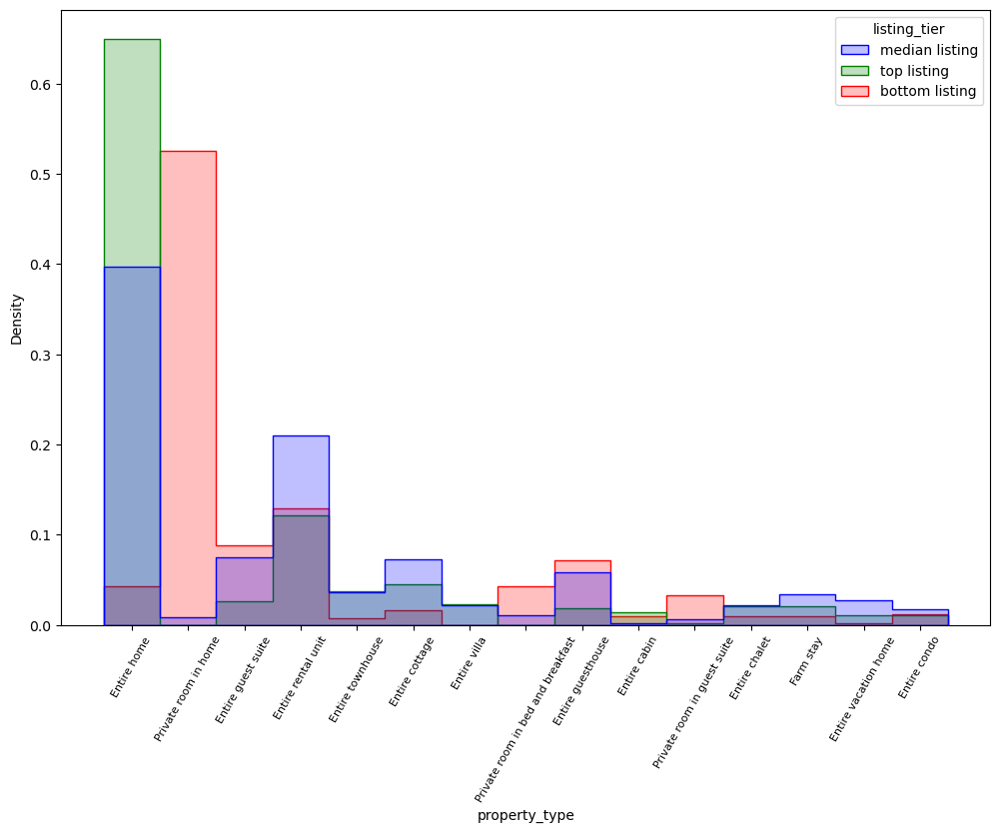

In [55]:
top_property_types = listing_tiers['property_type'].value_counts().head(15).index.tolist()
filtered_listing_properties = listing_tiers[listing_tiers['property_type'].isin(top_property_types)]
custom_palette = {'top listing': 'green', 'median listing': 'blue', 'bottom listing': 'red'} 
plt.figure(figsize=(12, 8))
sns.histplot(
    filtered_listing_properties, x="property_type", hue="listing_tier", element="step",
    stat="density", common_norm=False, palette = custom_palette)
plt.xticks(rotation=60, fontsize=8)
plt.show()

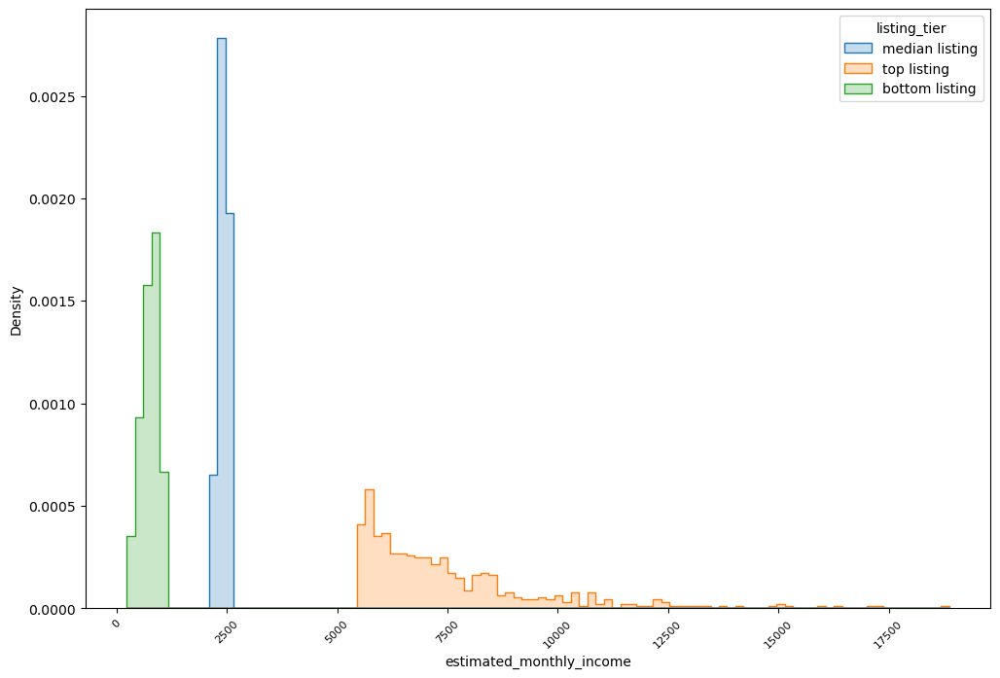

In [56]:
plt.figure(figsize=(12, 8))
sns.histplot(
    listing_tiers, x="estimated_monthly_income", hue="listing_tier", element="step",
    stat="density", common_norm=False, bins = 100)
plt.xticks(rotation=45, fontsize=8)
plt.show()

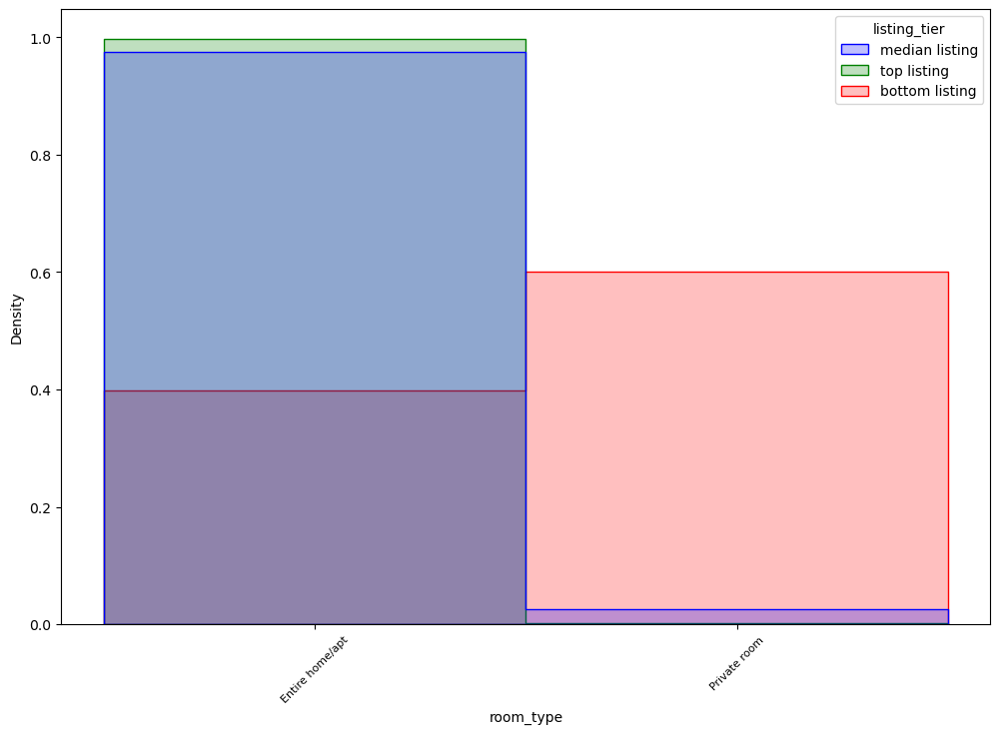

In [57]:
plt.figure(figsize=(12, 8))
custom_palette = {'top listing': 'green', 'median listing': 'blue', 'bottom listing': 'red'} 
sns.histplot(
    filtered_listing_properties, x="room_type", hue="listing_tier", element="step",
    stat="density", common_norm=False, palette = custom_palette)
plt.xticks(rotation=45, fontsize=8)
plt.show()

In [58]:
listings.room_type.unique()

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

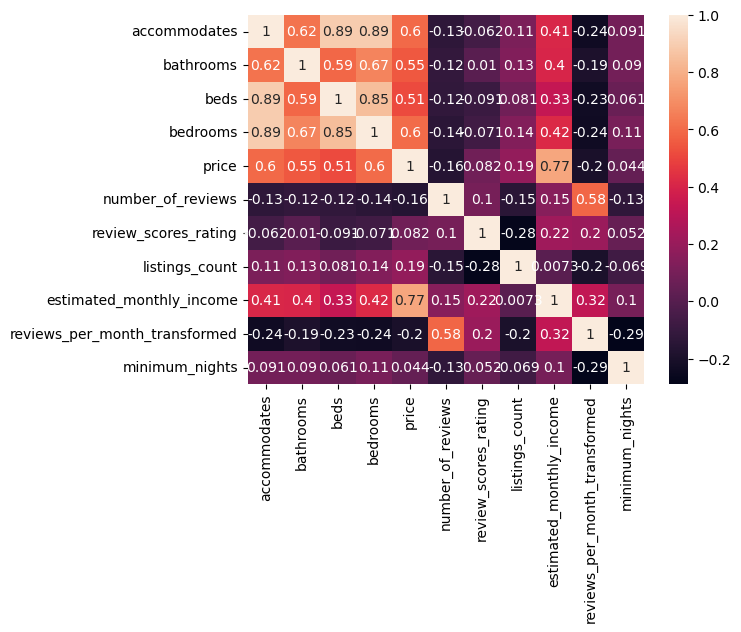

In [59]:
sns.heatmap(final_listings[['property_type', 'room_type', 'accommodates', 'bathrooms', 'beds',
           'bedrooms', 'price', 'number_of_reviews', 'review_scores_rating', 'listings_count', 'estimated_monthly_income', 'reviews_per_month_transformed', 'minimum_nights']].corr(numeric_only = True), annot = True)
plt.rcParams['figure.figsize'] = (8, 10) 
plt.show()

Key takeaways from the correlation matrix:
- Estimated monthly income is moderately correlated with the number of bathrooms and bedrooms, as to be somewhat expected
- The number of people a listing accommodates has a very strong correlation with the number of bedrooms
- The price of a listing has strong correlation with the number of bedrooms, and hence with the number of people accommodated
- Estimated income is strongly correlated to price, but only weakly correlated to the reviews per month.
- Reviews per month is negatively correlated with minimum nights as well as people accommodated, beds etc, likely a result of larger houses having larger values for minimum nights, resulting in less overall bookings



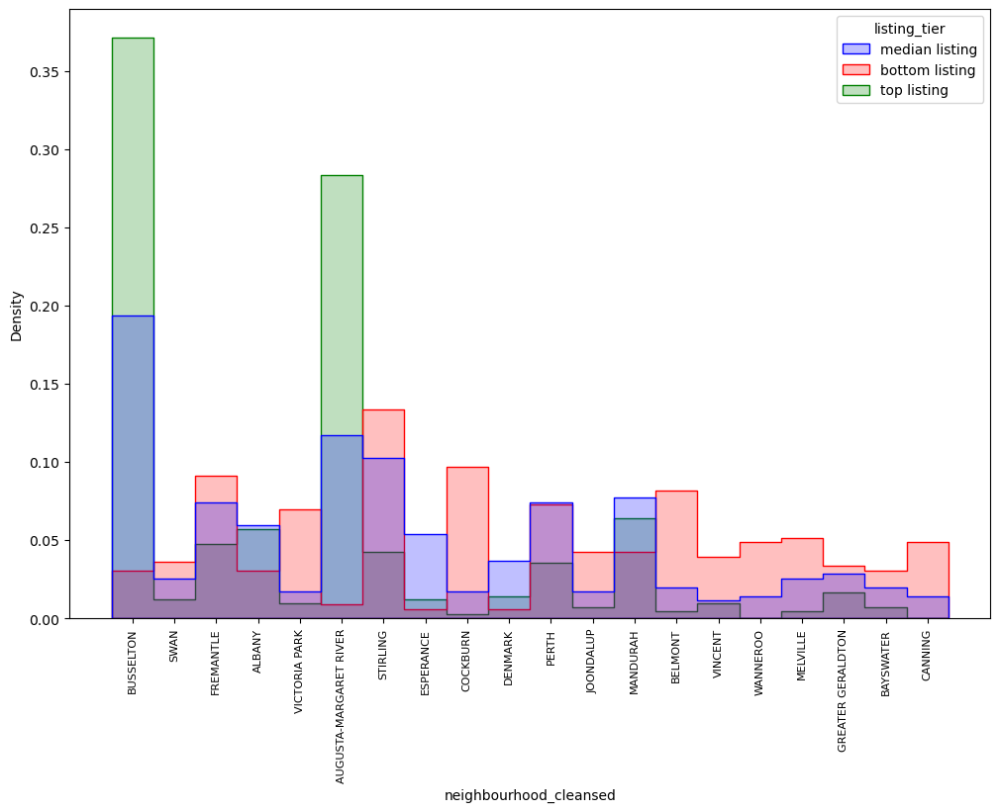

In [60]:
top_neighbourhoods = listing_tiers['neighbourhood_cleansed'].value_counts().head(20).index.tolist()
filtered_listing_neighbourhoods = listing_tiers[listing_tiers['neighbourhood_cleansed'].isin(top_neighbourhoods)]


custom_palette = {'top listing': 'green', 'median listing': 'blue', 'bottom listing': 'red'}
plt.figure(figsize=(12, 8))
sns.histplot(
    filtered_listing_neighbourhoods, x="neighbourhood_cleansed", hue="listing_tier", element="step",
    stat="density", common_norm=False, palette=custom_palette)
plt.xticks(rotation=90, fontsize=8)
plt.show()

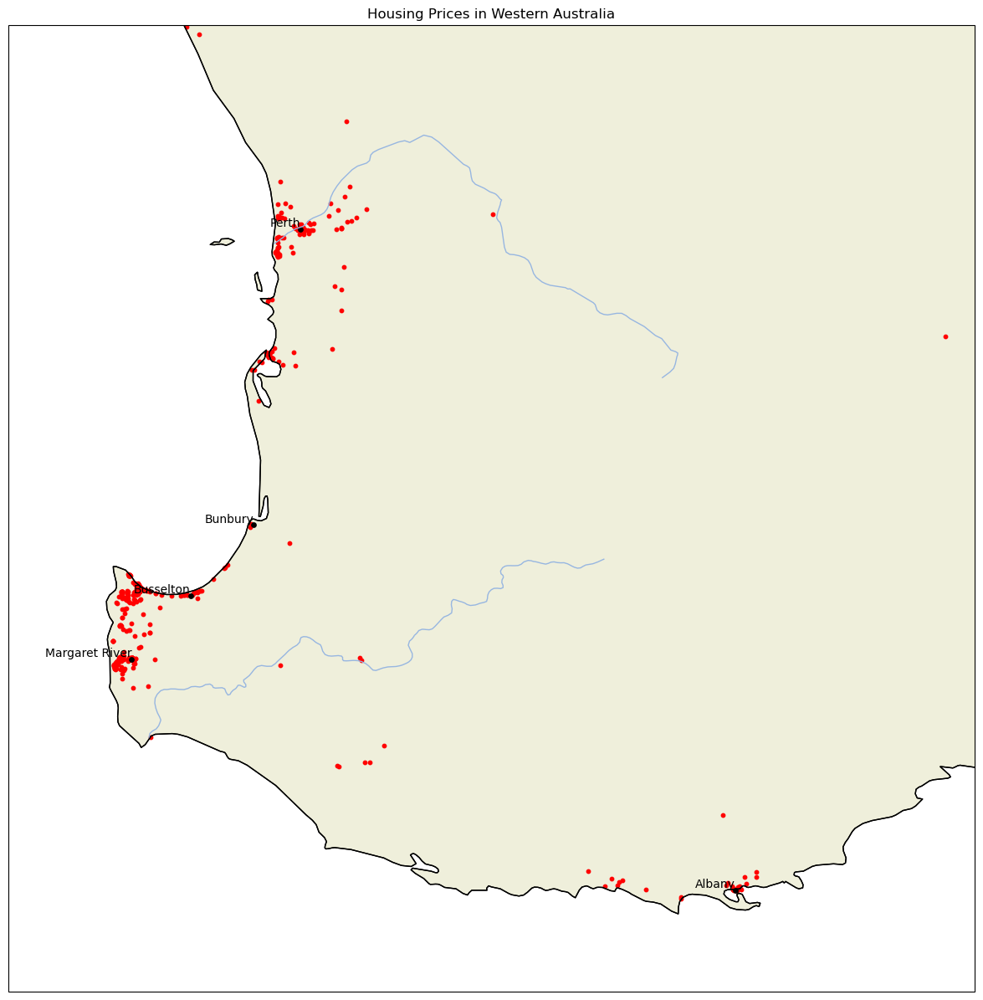

In [61]:


plt.figure(figsize=(15,15))

# Creates the map focusing on Western Australia
wa_map = plt.axes(projection=ccrs.PlateCarree())
wa_map.set_extent([114.5, 119, -35.5, -31])  # Adjust the extent to cover Western Australia

wa_map.add_feature(cfeature.LAND)
wa_map.add_feature(cfeature.COASTLINE.with_scale('10m'))
wa_map.add_feature(cfeature.BORDERS, linestyle='a')
wa_map.add_feature(cfeature.LAKES, alpha=0.5)
wa_map.add_feature(cfeature.RIVERS)
wa_map.add_feature(cfeature.STATES.with_scale('10m'))

# Plots the data onto map
plt.scatter(top_listings['longitude'], top_listings['latitude'], alpha=1, 
            s=10, #label="population",
            c='red', 
            #cmap=plt.get_cmap("jet"), 
            transform=ccrs.PlateCarree())
cities = {
    'Perth': (-31.9505, 115.8605),
    'Albany': (-35.0275, 117.8840),
    'Bunbury': (-33.3274, 115.6414),
    'Busselton': (-33.6561, 115.3488),
    'Margaret River': (-33.9536, 115.0739),
}

for city, (lat, lon) in cities.items():
    plt.scatter(lon, lat, marker='o', color='black', s=15, label=city)
    plt.text(lon, lat, city, fontsize=10, ha='right', va='bottom')


# Colorbar
prices = top_listings["estimated_monthly_income"]
tick_values = np.linspace(prices.min(), prices.max(), 9)
#cbar = plt.colorbar()
#cbar.ax.set_yticklabels(["$%dk"%(round(v/1000)) for v in tick_values], fontsize=14)
#cbar.set_label('Estimated Monthly Income', fontsize=16)

# Plot labels
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

plt.title("Housing Prices in Western Australia")
plt.show()

There are few listings near Perth that are top performers, and they're genereally situated around Fremantle, scarborough, or near to the centre of the city. On the other hand, bottom listings are dispersed quite evenly throughout the suburbs, with much more listings being located near Perth.

Down south the situation is reversed, with a high density of top listings situated in the stretch between Margaret River and Busselton, most of which lie along the coast or within a short distance. There are very few bottom listings in this region.

In [62]:
import plotly.graph_objects as go

# Create hover text for bottom listings
bottom_hover_text = bottom_listings[['list_number','property_type', 'room_type','bedrooms', 'bathrooms', 'price', 'reviews_per_month_transformed', 'minimum_nights']].astype(str)
bottom_hover_text = ['<br>'.join(['{}: {}'.format(col, val) for col, val in zip(bottom_hover_text.columns, row)]) for row in bottom_hover_text.values]

# Create hover text for median listings
median_hover_text = median_listings[['list_number','property_type', 'room_type','bedrooms', 'bathrooms', 'price', 'reviews_per_month_transformed', 'minimum_nights']].astype(str)
median_hover_text = ['<br>'.join(['{}: {}'.format(col, val) for col, val in zip(median_hover_text.columns, row)]) for row in median_hover_text.values]

# Create hover text for top listings
top_hover_text = top_listings[['list_number','property_type', 'room_type','bedrooms', 'bathrooms', 'price', 'reviews_per_month_transformed', 'minimum_nights']].astype(str)
top_hover_text = ['<br>'.join(['{}: {}'.format(col, val) for col, val in zip(top_hover_text.columns, row)]) for row in top_hover_text.values]

# Create hover text for all listings
all_hover_text = final_listings[['list_number','property_type', 'room_type','bedrooms', 'bathrooms', 'price', 'reviews_per_month_transformed', 'minimum_nights']].astype(str)
all_hover_text = ['<br>'.join(['{}: {}'.format(col, val) for col, val in zip(all_hover_text.columns, row)]) for row in all_hover_text.values]

# Create scatter plot for bottom listings
bottom_scatter = go.Scattermapbox(
    lat=bottom_listings['latitude'],
    lon=bottom_listings['longitude'],
    mode='markers',
    marker=dict(
        size=6,
        color='red'
    ),
    name='Bottom Listings',
    hovertext=bottom_hover_text,  # Define hover text for bottom listings
)

# Create scatter plot for median listings
median_scatter = go.Scattermapbox(
    lat=median_listings['latitude'],
    lon=median_listings['longitude'],
    mode='markers',
    marker=dict(
        size=6,
        color='orange'
    ),
    name='Median Listings',
    hovertext=median_hover_text,  # Define hover text for median listings
)

# Create scatter plot for top listings
top_scatter = go.Scattermapbox(
    lat=top_listings['latitude'],
    lon=top_listings['longitude'],
    mode='markers',
    marker=dict(
        size=6,
        color='green'
    ),
    name='Top Listings',
    hovertext=top_hover_text,  # Define hover text for top listings
)

# Create scatter plot for all listings
all_scatter = go.Scattermapbox(
    lat=final_listings['latitude'],
    lon=final_listings['longitude'],
    mode='markers',
    marker=dict(
        size=6,
        color='black'
    ),
    name='All Listings',
    hovertext=all_hover_text,  # Define hover text for all listings
)

# Define layout
layout = go.Layout(
    mapbox=dict(
        style="carto-positron",
        center=dict(
            lat=-33.8,
            lon=115.1
        ),
        zoom=8
    ),
    title='Listing Locations'
)

# Create figure
fig = go.Figure(data=[all_scatter, bottom_scatter, median_scatter, top_scatter], layout=layout)
fig.update_layout(width=1000, height=1000)
fig.update_traces(marker=dict(opacity=1))

# Show plot
fig.show()

There are few listings near Perth that are top performers, and they're genereally situated around Fremantle, scarborough, or near to the centre of the city. On the other hand, bottom listings are dispersed quite evenly throughout the suburbs, with much more listings being located near Perth.

Down south the situation is reversed, with a high density of top listings situated in the stretch between Margaret River and Busselton, most of which lie along the coast or within a short distance. There are very few bottom listings in this region.

# Picture collage


In [63]:
url_list = final_listings.sort_values(by = 'estimated_monthly_income', ascending = True).iloc[0:51].listing_url.reset_index(drop=True).tolist()

In [64]:
def image_scraper(urls):
    image_links_list = []
    driver = webdriver.Chrome()  # Initialize Selenium webdriver

    for i, url in enumerate(urls, 1):  # Use enumerate to get both index and value, start index at 1
        driver.get(url)  # Load the webpage
        page_source = driver.page_source  # Get the page source after JavaScript rendering
        soup = BeautifulSoup(page_source, 'html.parser')  # Parse the page source with BeautifulSoup
        image_tags = soup.find_all('img', {'class' : "itu7ddv atm_e2_idpfg4 atm_vy_idpfg4 atm_mk_stnw88 atm_e2_1osqo2v__1lzdix4 atm_vy_1osqo2v__1lzdix4 i1cqnm0r atm_jp_pyzg9w atm_jr_nyqth1 i1de1kle atm_vh_yfq0k3 dir dir-ltr", 'alt':""})  # Find all image tags

        image_links = [img['src'] for img in image_tags if 'src' in img.attrs]  # Extract image links
        image_links_list.append(image_links)  # Append image links to the list

        print(f'URL {i} is scraped.')  # Print message indicating URL is scraped

    driver.quit()  # Close the webdriver
    return image_links_list

urls = url_list

scraped_links = image_scraper(urls)
scraped_links_flat = [link for sublist in scraped_links for link in sublist]
scraped_links_df = pd.DataFrame(scraped_links_flat, columns=['scraped_links'])
scraped_links_df

URL 1 is scraped.
URL 2 is scraped.
URL 3 is scraped.
URL 4 is scraped.


KeyboardInterrupt: 

In [ ]:
scraped_links_flat = [link for sublist in scraped_links for link in sublist]
scraped_links_df = pd.DataFrame(scraped_links_flat, columns=['scraped_links'])
#scraped_links_df = scraped_links_df[0:40]

In [ ]:
# Function to fetch and resize image from URL
def fetch_and_resize_image(url, size=(720, 480)):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img = img.resize(size)
    return img

# Function to create collage
def create_collage(images, collage_size):
    cols, rows = collage_size
    collage_width = cols * images[0].width
    collage_height = rows * images[0].height
    collage = Image.new('RGB', (collage_width, collage_height))

    for i, img in enumerate(images):
        x = i % cols
        y = math.floor(i / cols)
        collage.paste(img, (x * images[0].width, y * images[0].height))

    return collage

# Fetch and resize images from URLs
images = []
for i, url in enumerate(scraped_links_df['scraped_links'], 1):
    print(f'Fetching and resizing image {i}...')
    image = fetch_and_resize_image(url)
    images.append(image)

# Calculate number of rows and columns for collage grid
num_images = len(images)
num_cols = 5  # Example: 5 columns
num_rows = math.ceil(num_images / num_cols)

# Create collage
print('Creating collage...')
collage = create_collage(images, collage_size=(num_cols, num_rows))

# Save collage
collage.save('bottom_listings.jpg')
print('Collage Saved.jpg')